<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 250%; color: white; border-radius: 80px 20px; padding: 25px; text-align: center;"> <b>Car Price Prediction Project</b>
</h1>

<img src="forbidden.png" style="width: 150px; margin-left: 20px; float:right; margin-top: -30px;" alt="Small Truck Icon">
<span style="display: inline-block; width: calc(80% - 20px); text-align: center;"></span>


**Auto Scout** data, which is used for this project, was scraped from the online car trading company [AutoScout24](https://www.autoscout24.com) in 2019. It contains many features of 9 different car models. In this project, you will use a preprocessed and prepared dataset for algorithms.

The aim of this project is to understand machine learning algorithms. Therefore, you will not need any EDA process as you will be working on the edited data.

---

## Scenario

In this scenario, you will estimate the prices of cars using regression algorithms.

You should start by importing the necessary modules and loading the data given as a `.pkl` file. Some preprocessing will be needed before moving to modeling. You will implement **Linear Regression, Ridge Regression, Lasso Regression, and Elastic-Net algorithms** respectively. After completing the Unsupervised Learning section, you can also add bagging and boosting algorithms such as **Random Forest and XG Boost** to develop the project further. You can measure the success of your models with regression evaluation metrics as well as with the cross-validation method.

For better results, you should try to increase the success of your models by performing hyperparameter tuning. Determine feature importances for the model. You can set your model with the most important features for resource saving. This is especially important for Random Forest and XG Boost algorithms. Unlike the others, you will perform hyperparameter tuning for Random Forest and XG Boost using the **GridSearchCV** method.

Finally, you can compare the performances of the algorithms and work more on the one with the most successful prediction rate.

## Features

1. **make_model**: Contains the make and model information of the vehicles.
2. **body_type**: Indicates the body type of the vehicles (e.g., sedan, hatchback).
3. **price**: Contains the price information of the vehicles.
4. **vat**: Contains value-added tax (VAT) information (often important in vehicle sales).
5. **km**: Contains the mileage information of the vehicles.
6. **Type**: Indicates the type of the vehicle (e.g., new, used).
7. **Fuel**: Indicates the type of fuel used (e.g., petrol, diesel).
8. **Gears**: Contains the number of gears in the vehicles.
9. **Comfort_Convenience**: Contains the comfort and convenience features of the vehicles.
10. **Entertainment_Media**: Contains entertainment and media features.
11. **Extras**: Contains the extra features of the vehicles.
12. **Safety_Security**: Contains safety features.
13. **age**: The age of the vehicles.
14. **Previous_Owners**: Contains the number of previous owners of the vehicles.
15. **hp_kW**: Contains the horsepower of the vehicles in kilowatts.
16. **Inspection_new**: Contains information about whether the vehicle has a new inspection.
17. **Paint_Type**: Contains the type of paint of the vehicles.
18. **Upholstery_type**: Contains the type of upholstery in the vehicles.
19. **Gearing_Type**: Indicates the type of transmission in the vehicles.
20. **Displacement_cc**: Indicates the engine displacement in cubic centimeters (cc).
21. **Weight_kg**: Indicates the weight of the vehicles in kilograms.
22. **Drive_chain**: Indicates the type of drivetrain in the vehicles (e.g., front-wheel drive, rear-wheel drive).
23. **cons_comb**: Indicates the combined fuel consumption of the vehicles in liters per 100 kilometers.


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Import Libraries</b>
</h2>

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
 
#%matplotlib inline  

import warnings
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('display.max_columns', 100)

import scipy.stats as stats
import inflection
from skimpy import clean_columns
import missingno as msno
import plotly.graph_objects as go
from scipy.stats import skew

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Read Dataset</b>
</h2>

In [3]:
auto = pd.read_csv("final_scout_not_dummy.csv")
df = auto.copy()
df

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
0,Audi A1,Sedans,15770,VAT deductible,56013.000000,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.0,2.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1220.0,front,3.8
1,Audi A1,Sedans,14500,Price negotiable,80000.000000,Used,Benzine,7.0,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r...",2.0,1.0,141.0,0,Metallic,Cloth,Automatic,1798.0,1255.0,front,5.6
2,Audi A1,Sedans,14640,VAT deductible,83450.000000,Used,Diesel,7.0,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.0,1.0,85.0,0,Metallic,Cloth,Automatic,1598.0,1135.0,front,3.8
3,Audi A1,Sedans,14500,VAT deductible,73000.000000,Used,Diesel,6.0,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote...",3.0,1.0,66.0,0,Metallic,Cloth,Automatic,1422.0,1195.0,front,3.8
4,Audi A1,Sedans,16790,VAT deductible,16200.000000,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect...",3.0,1.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1135.0,front,4.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15910,Renault Espace,Van,39950,VAT deductible,1647.362609,New,Diesel,6.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Hands-free equipment,O...","Alloy wheels,Touch screen","ABS,Central door lock,Central door lock with r...",0.0,1.0,147.0,0,Metallic,Part/Full Leather,Automatic,1997.0,1758.0,front,5.3
15911,Renault Espace,Van,39885,VAT deductible,9900.000000,Used,Benzine,7.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Hands-free equipment,R...","Alloy wheels,Touch screen,Voice Control","ABS,Adaptive Cruise Control,Blind spot monitor...",0.0,1.0,165.0,0,Metallic,Cloth,Automatic,1798.0,1708.0,front,7.4
15912,Renault Espace,Van,39875,VAT deductible,15.000000,Pre-registered,Diesel,6.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...",Alloy wheels,"ABS,Adaptive Cruise Control,Blind spot monitor...",0.0,1.0,146.0,1,Metallic,Part/Full Leather,Automatic,1997.0,1734.0,front,5.3
15913,Renault Espace,Van,39700,VAT deductible,10.000000,Pre-registered,Diesel,6.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Radio,USB","Alloy wheels,Touch screen","ABS,Blind spot monitor,Driver-side airbag,Elec...",0.0,1.0,147.0,0,Metallic,Part/Full Leather,Automatic,1997.0,1758.0,front,5.3


In [4]:
df.shape

(15915, 23)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           15915 non-null  object 
 1   body_type            15915 non-null  object 
 2   price                15915 non-null  int64  
 3   vat                  15915 non-null  object 
 4   km                   15915 non-null  float64
 5   Type                 15915 non-null  object 
 6   Fuel                 15915 non-null  object 
 7   Gears                15915 non-null  float64
 8   Comfort_Convenience  15915 non-null  object 
 9   Entertainment_Media  15915 non-null  object 
 10  Extras               15915 non-null  object 
 11  Safety_Security      15915 non-null  object 
 12  age                  15915 non-null  float64
 13  Previous_Owners      15915 non-null  float64
 14  hp_kW                15915 non-null  float64
 15  Inspection_new       15915 non-null 

In [6]:
# Veri setindeki yinelenen gözlemleri kontrol eder ve bunları kaldırır

def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

In [7]:
duplicate_values(df)

Duplicate check...
There are 1673 duplicated observations in the dataset.
1673 duplicates were dropped!
No more duplicate rows!


In [8]:
df.isnull().sum()

make_model             0
body_type              0
price                  0
vat                    0
km                     0
Type                   0
Fuel                   0
Gears                  0
Comfort_Convenience    0
Entertainment_Media    0
Extras                 0
Safety_Security        0
age                    0
Previous_Owners        0
hp_kW                  0
Inspection_new         0
Paint_Type             0
Upholstery_type        0
Gearing_Type           0
Displacement_cc        0
Weight_kg              0
Drive_chain            0
cons_comb              0
dtype: int64

In [9]:
import missingno as msno

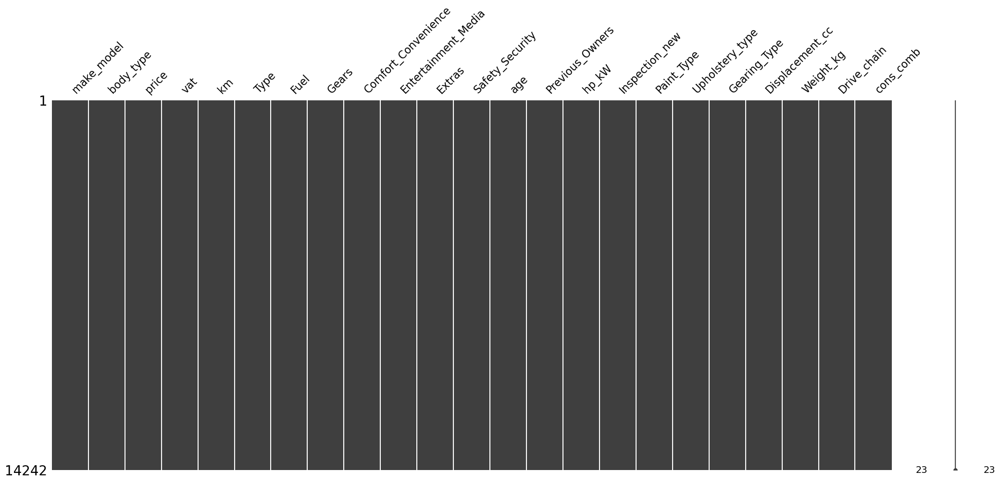

In [10]:
msno.matrix(df);

<Axes: >

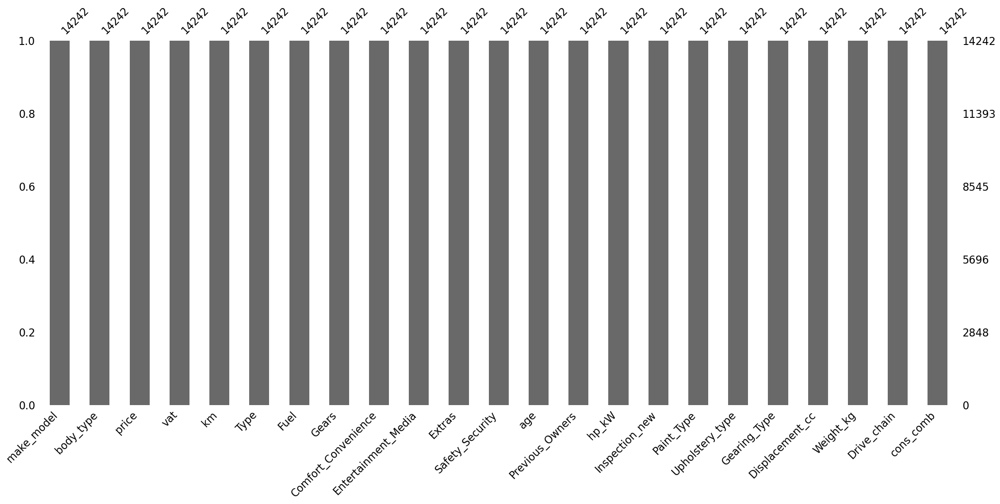

In [11]:
msno.bar(df)

In [12]:
missing_count = df.isnull().sum()
value_count = df.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
missing_df

,count,percentage
make_model,0,0.0
body_type,0,0.0
price,0,0.0
vat,0,0.0
km,0,0.0
Type,0,0.0
Fuel,0,0.0
Gears,0,0.0
Comfort_Convenience,0,0.0
Entertainment_Media,0,0.0


In [13]:
df.sort_values(by="price", ascending=False)

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
3648,Audi A3,Sedans,74600,VAT deductible,13000.0,Used,Benzine,7.0,"Air conditioning,Armrest,Automatic climate con...","CD player,On-board computer,Radio","Alloy wheels,Sport seats,Sport suspension","ABS,Alarm system,Central door lock,Driver-side...",1.0,1.0,294.0,0,Metallic,Part/Full Leather,Semi-automatic,2480.0,1490.0,4WD,8.3
15822,Renault Espace,Van,68320,VAT deductible,4307.0,Demonstration,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Digital radio,Hands-free e...","Alloy wheels,Roof rack","ABS,Adaptive Cruise Control,Adaptive headlight...",0.0,1.0,118.0,0,Metallic,Part/Full Leather,Automatic,1598.0,1734.0,front,6.5
3649,Audi A3,Compact,67600,VAT deductible,37747.0,Used,Benzine,7.0,"Air conditioning,Armrest,Automatic climate con...","CD player,On-board computer,Radio","Alloy wheels,Roof rack,Sport seats,Sport suspe...","ABS,Alarm system,Central door lock,Driver-side...",2.0,1.0,294.0,0,Metallic,Part/Full Leather,Semi-automatic,2480.0,1485.0,4WD,8.3
3587,Audi A3,Sedans,64900,VAT deductible,35000.0,Used,Benzine,7.0,"Air conditioning,Seat ventilation,Split rear s...",Radio,Alloy wheels,"Adaptive Cruise Control,Alarm system,Central d...",1.0,1.0,294.0,0,Metallic,Part/Full Leather,Semi-automatic,2480.0,1585.0,front,8.3
15824,Renault Espace,Van,64332,VAT deductible,1.0,New,Benzine,6.0,"Air conditioning,Armrest,Automatic climate con...","Digital radio,Hands-free equipment,Radio","Alloy wheels,Voice Control","ABS,Alarm system,Blind spot monitor,Daytime ru...",0.0,1.0,165.0,0,Metallic,Part/Full Leather,Automatic,1798.0,1647.0,front,7.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13766,Renault Clio,Sedans,5445,VAT deductible,123000.0,Used,Diesel,5.0,Air conditioning,Radio,Alloy wheels,Central door lock with remote control,3.0,1.0,55.0,0,Metallic,Cloth,Manual,1461.0,1146.0,front,3.6
8822,Opel Corsa,Compact,5300,VAT deductible,173021.0,Used,Diesel,5.0,"Air conditioning,Electrical side mirrors,Navig...","CD player,On-board computer",Alloy wheels,"ABS,Central door lock,Daytime running lights,D...",3.0,1.0,55.0,0,Metallic,Cloth,Manual,1248.0,1163.0,front,3.9
8824,Opel Corsa,Transporter,5250,VAT deductible,80000.0,Used,Diesel,5.0,"Air conditioning,Electrical side mirrors,Multi...","Bluetooth,Radio,USB","Alloy wheels,Catalytic Converter","ABS,Central door lock,Central door lock with r...",3.0,1.0,55.0,0,Uni/basic,Cloth,Manual,1248.0,1199.0,front,3.8
8823,Opel Corsa,Compact,4990,VAT deductible,79000.0,Used,Benzine,5.0,"Air conditioning,Cruise control,Electrical sid...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Touch screen","ABS,Central door lock,Central door lock with r...",3.0,1.0,66.0,0,Metallic,Cloth,Manual,1398.0,1141.0,front,5.2


In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,14242.0,18100.969457,7421.213772,4950.0,12950.0,16950.0,21900.0,74600.0
km,14242.0,32582.109593,36856.863207,0.0,3898.0,21000.0,47000.0,317000.0
Gears,14242.0,5.939545,0.702846,5.0,5.0,6.0,6.0,8.0
age,14242.0,1.415040,1.109537,0.0,0.0,1.0,2.0,3.0
Previous_Owners,14242.0,1.040795,0.337413,0.0,1.0,1.0,1.0,4.0
hp_kW,14242.0,88.713453,26.548219,40.0,66.0,85.0,103.0,294.0
Inspection_new,14242.0,0.256284,0.436596,0.0,0.0,0.0,1.0,1.0
Displacement_cc,14242.0,1432.889763,277.506916,890.0,1229.0,1461.0,1598.0,2967.0
Weight_kg,14242.0,1342.399312,201.246784,840.0,1165.0,1320.0,1487.0,2471.0
cons_comb,14242.0,4.825183,0.862170,3.0,4.1,4.8,5.4,9.1


In [15]:
df.describe(include="object").T

,count,unique,top,freq
make_model,14242,9,Audi A3,2758
body_type,14242,8,Sedans,7230
vat,14242,2,VAT deductible,13426
Type,14242,5,Used,10172
Fuel,14242,4,Benzine,7558
Comfort_Convenience,14242,6196,"Air conditioning,Electrical side mirrors,Hill ...",312
Entertainment_Media,14242,346,"Bluetooth,Hands-free equipment,On-board comput...",1562
Extras,14242,659,Alloy wheels,5010
Safety_Security,14242,4442,"ABS,Central door lock,Daytime running lights,D...",635
Paint_Type,14242,3,Metallic,13682


In [16]:
df.columns

Index(['make_model', 'body_type', 'price', 'vat', 'km', 'Type', 'Fuel',
       'Gears', 'Comfort_Convenience', 'Entertainment_Media', 'Extras',
       'Safety_Security', 'age', 'Previous_Owners', 'hp_kW', 'Inspection_new',
       'Paint_Type', 'Upholstery_type', 'Gearing_Type', 'Displacement_cc',
       'Weight_kg', 'Drive_chain', 'cons_comb'],
      dtype='object')

In [17]:
df = clean_columns(df)
df.columns

Index(['make_model', 'body_type', 'price', 'vat', 'km', 'type', 'fuel',
       'gears', 'comfort_convenience', 'entertainment_media', 'extras',
       'safety_security', 'age', 'previous_owners', 'hp_k_w', 'inspection_new',
       'paint_type', 'upholstery_type', 'gearing_type', 'displacement_cc',
       'weight_kg', 'drive_chain', 'cons_comb'],
      dtype='object')

**---Alternative Methods for change columns names**

In [18]:
#df.rename(columns={ '    ': '    ',
                  #  'make_model': 'model',,... }, inplace=True)

In [19]:
#df.columns

In [20]:
#Second method
#df.columns = [inflection.camelize(column, False) for column in df.columns]
#df.columns

In [21]:
#df.columns = [inflection.underscore(column) for column in df.columns]
#df.columns

In [22]:
#df.columns = [inflection.dasherize(inflection.underscore(column)).lower() for column in df.columns]
#df.columns

In [23]:
#df.columns = [inflection.humanize(inflection.underscore(column)) for column in df.columns]
#df.columns

In [24]:
#df.columns = [inflection.titleize(column).replace(' ', '') for column in df.columns]
#df.columns

In [25]:
#for i in df.columns:
    #print(i)

In [26]:
#missing_count = df.isnull().sum()
#value_count = df.isnull().count()
#missing_percentage = round(missing_count / value_count * 100, 2)
#missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
#missing_df


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Dummies Control ?</b>
</h2>

In [27]:
for col in df.select_dtypes('object'):
    print(f"{col:<20}:", df[col].nunique())
    
# <20 ile en soldan ":" işaretine kadar 20 karakterlik boşluk bırakılır ve feature isimleri bu boşluğa yazdırılır.
# ":" işareti tüm satırlarda aynı hizaya getirilmiş olur.

make_model          : 9
body_type           : 8
vat                 : 2
type                : 5
fuel                : 4
comfort_convenience : 6196
entertainment_media : 346
extras              : 659
safety_security     : 4442
paint_type          : 3
upholstery_type     : 2
gearing_type        : 3
drive_chain         : 3


In [28]:
df.make_model.value_counts()

make_model
Audi A3           2758
Opel Insignia     2417
Audi A1           2377
Opel Astra        2305
Opel Corsa        1994
Renault Clio      1486
Renault Espace     884
Renault Duster      20
Audi A2              1
Name: count, dtype: int64

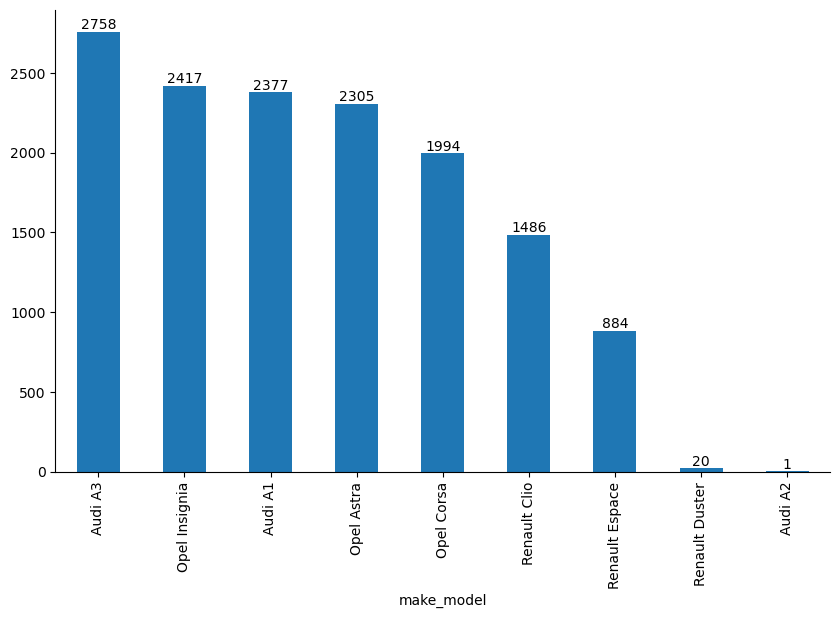

In [29]:
# Bu kod, DataFrame'imizdeki "make_model" sütunundaki uniq değerlerin sayısını hesaplar
# ve bu sayıları bar grafikte görselleştirir.

ax = df.make_model.value_counts().plot(kind ="bar")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.axis("off")
    
ax.bar_label(ax.containers[0]);

# for p in ax.patches:
#     ax.annotate(str(p.get_height()), (p.get_x() * 1.03, p.get_height() * 1.03))

In [30]:
df[df.make_model=="Audi A2"]

,make_model,body_type,price,vat,km,type,fuel,gears,comfort_convenience,entertainment_media,extras,safety_security,age,previous_owners,hp_k_w,inspection_new,paint_type,upholstery_type,gearing_type,displacement_cc,weight_kg,drive_chain,cons_comb
2614,Audi A2,Off-Road,28200,VAT deductible,26166.0,Employee's car,Diesel,6.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...",Alloy wheels,"ABS,Adaptive Cruise Control,Central door lock,...",1.0,1.0,85.0,0,Metallic,Cloth,Manual,1598.0,1135.0,front,4.9


In [31]:
df.drop(index=[2614], inplace =True)

In [32]:
df.shape

(14241, 23)

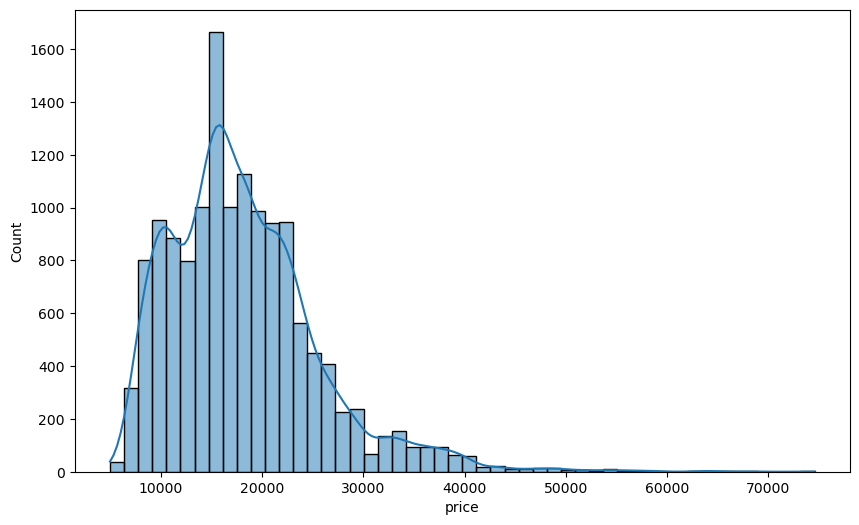

In [33]:
sns.histplot(df.price, bins=50, kde=True);

<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Data Preproccesing</b>
</h1>

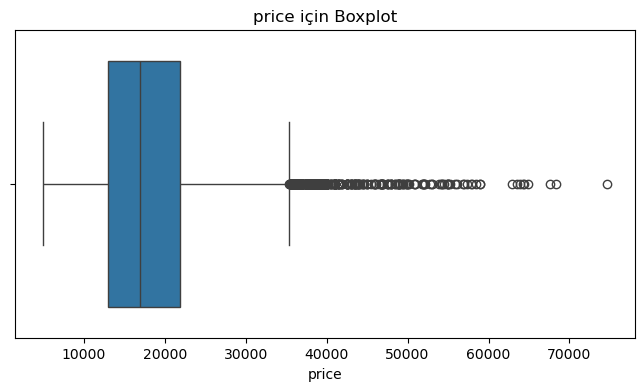

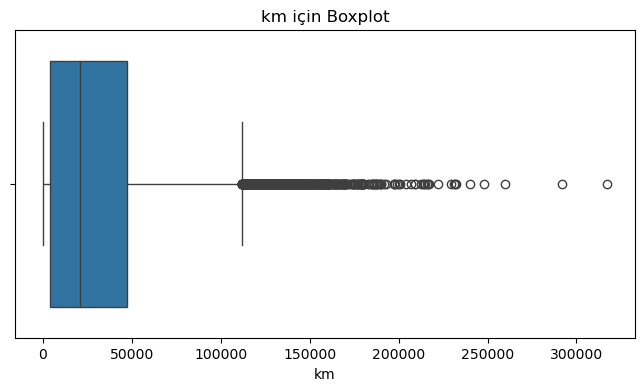

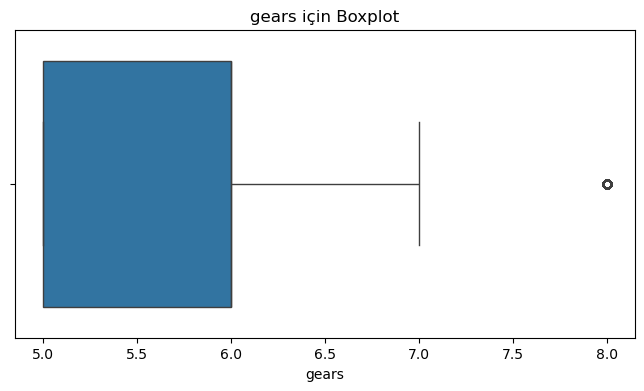

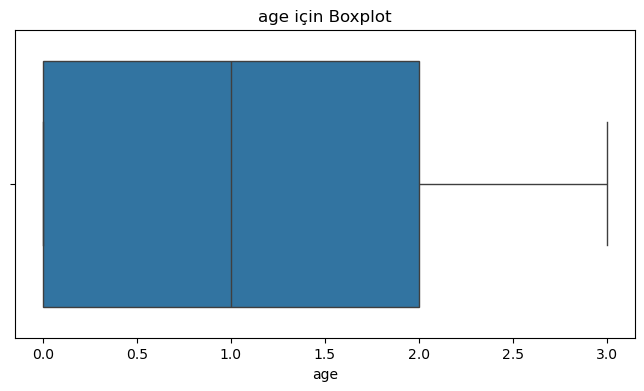

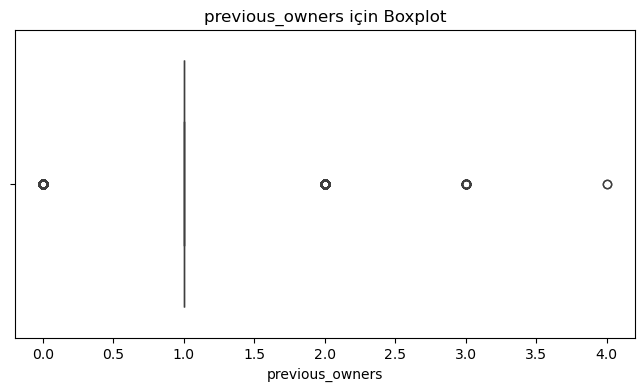

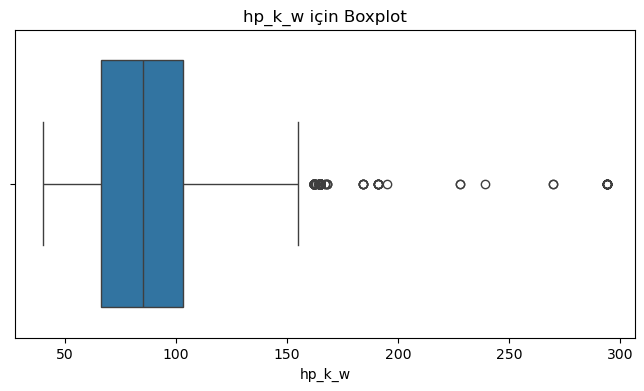

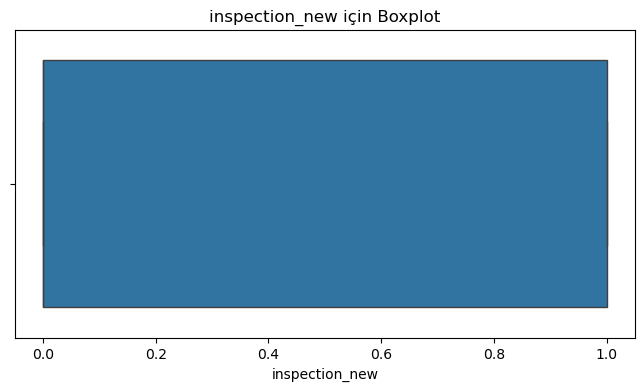

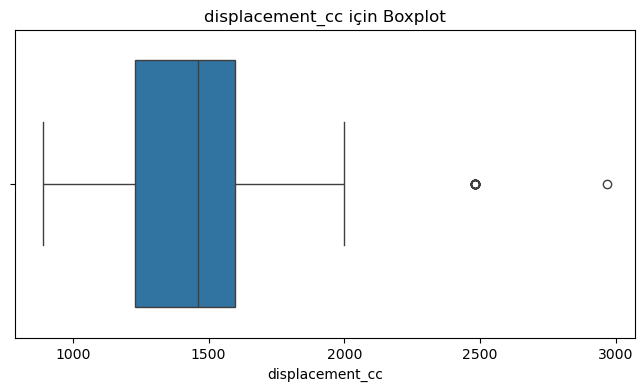

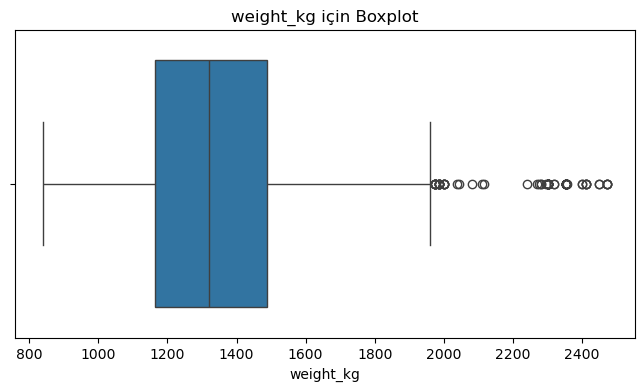

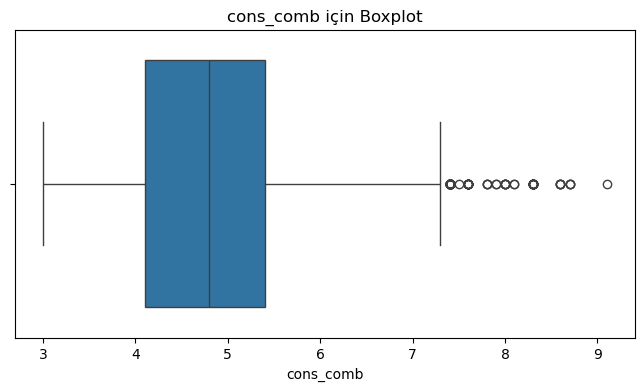

In [34]:
for col in df.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"{col} için Boxplot")
    plt.show()

In [35]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,14241.0,18100.260305,7420.991758,4950.0,12950.0,16950.0,21900.0,74600.0
km,14241.0,32582.560131,36858.118096,0.0,3898.0,21000.0,47000.0,317000.0
gears,14241.0,5.939541,0.702871,5.0,5.0,6.0,6.0,8.0
age,14241.0,1.415069,1.109570,0.0,0.0,1.0,2.0,3.0
previous_owners,14241.0,1.040798,0.337424,0.0,1.0,1.0,1.0,4.0
hp_k_w,14241.0,88.713714,26.549133,40.0,66.0,85.0,103.0,294.0
inspection_new,14241.0,0.256302,0.436606,0.0,0.0,0.0,1.0,1.0
displacement_cc,14241.0,1432.878169,277.513211,890.0,1229.0,1461.0,1598.0,2967.0
weight_kg,14241.0,1342.413875,201.246345,840.0,1165.0,1320.0,1487.0,2471.0
cons_comb,14241.0,4.825177,0.862200,3.0,4.1,4.8,5.4,9.1


In [36]:
# 1.5 wisker değerine göre her bir gruba ait outlier olabileceğini değerlendirdiğimiz gözlemleri tespit ediyoruz.

total_outliers = []

for model in df.make_model.unique():
    
    car_prices = df[df["make_model"]== model]["price"]
    
    Q1 = car_prices.quantile(0.25)
    Q3 = car_prices.quantile(0.75)
    IQR = Q3-Q1
    lower_lim = Q1-1.5*IQR
    upper_lim = Q3+1.5*IQR
    
    count_of_outliers = (car_prices[(car_prices < lower_lim) | (car_prices > upper_lim)]).count()
    
    total_outliers.append(count_of_outliers)
    
    print(f" The count of outlier for {model:<15} : {count_of_outliers:<5}, \
          The rate of outliers : {(count_of_outliers/len(df[df['make_model']== model])).round(3)}")
print()    
print("Total_outliers : ",sum(total_outliers), "The rate of total outliers :", (sum(total_outliers)/len(df)).round(3))

 The count of outlier for Audi A1         : 5    ,           The rate of outliers : 0.002
 The count of outlier for Audi A3         : 56   ,           The rate of outliers : 0.02
 The count of outlier for Opel Astra      : 127  ,           The rate of outliers : 0.055
 The count of outlier for Opel Corsa      : 0    ,           The rate of outliers : 0.0
 The count of outlier for Opel Insignia   : 109  ,           The rate of outliers : 0.045
 The count of outlier for Renault Clio    : 37   ,           The rate of outliers : 0.025
 The count of outlier for Renault Duster  : 0    ,           The rate of outliers : 0.0
 The count of outlier for Renault Espace  : 20   ,           The rate of outliers : 0.023

Total_outliers :  354 The rate of total outliers : 0.025


In [37]:
df.shape

(14241, 23)

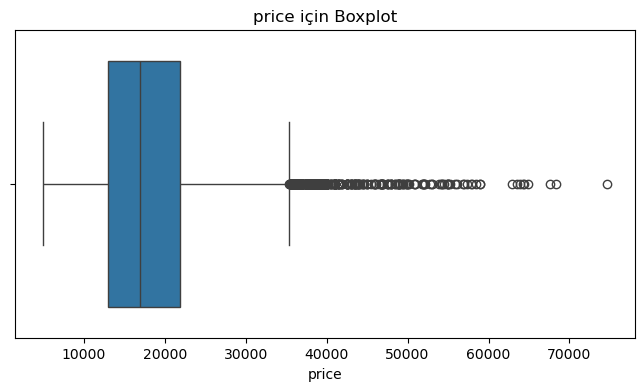

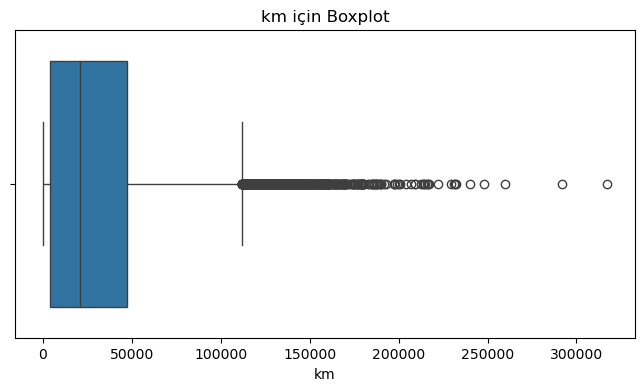

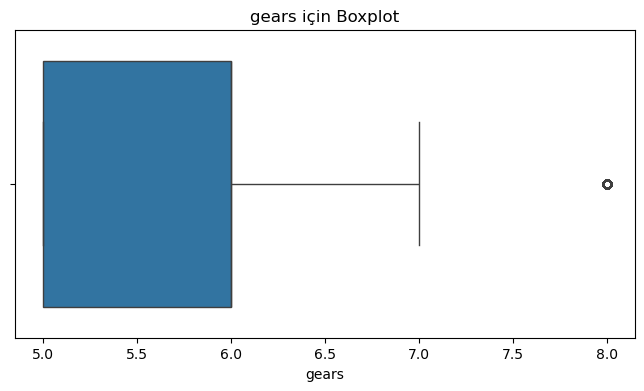

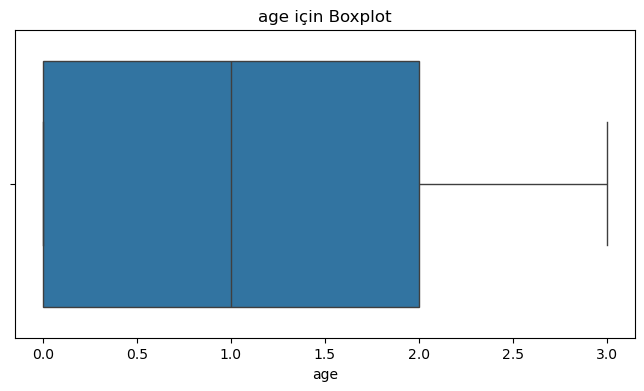

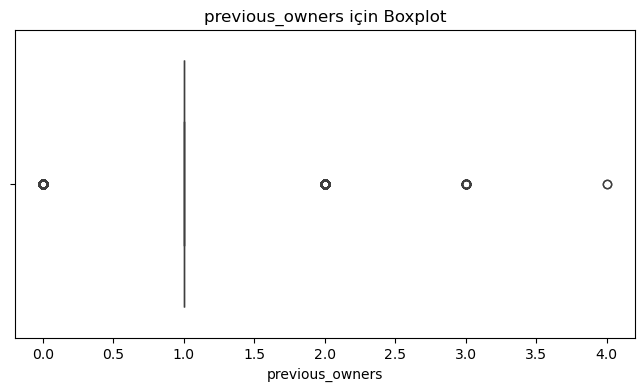

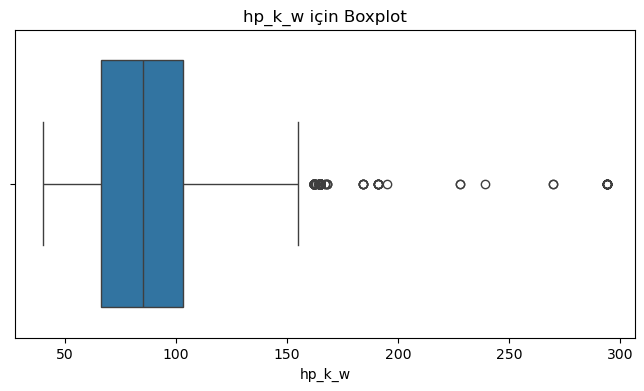

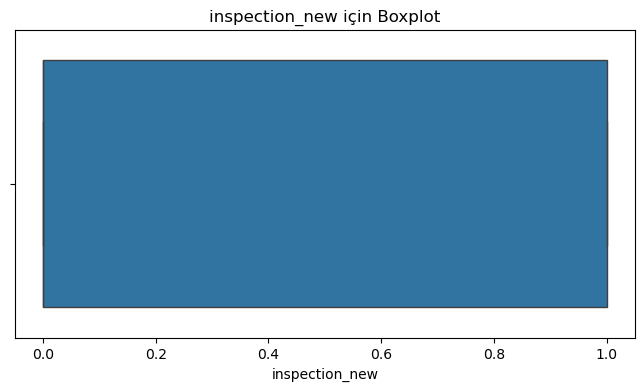

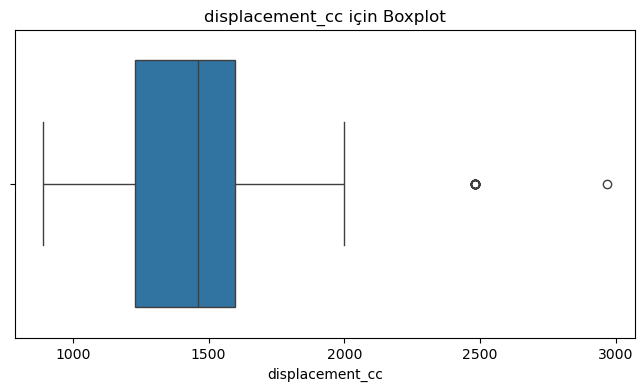

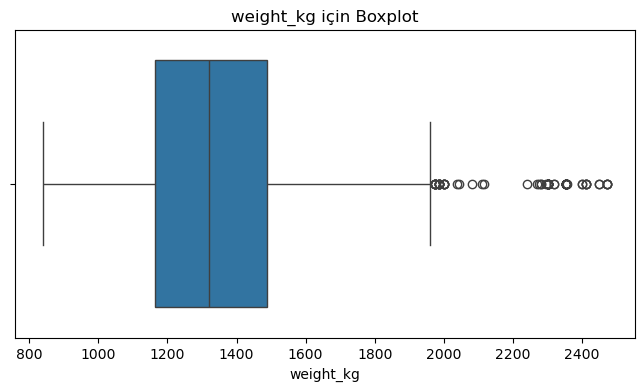

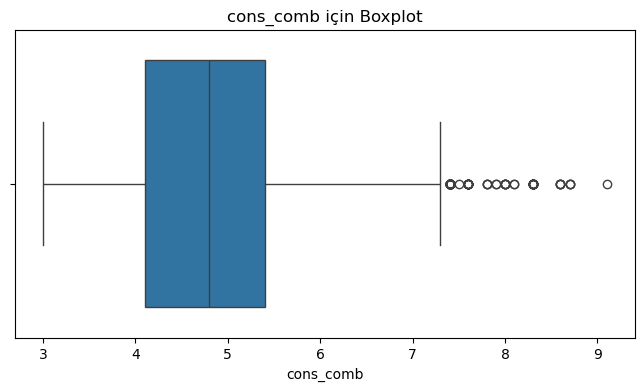

In [38]:
for col in df.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"{col} için Boxplot")
    plt.show()

def remove_outliers_specific_columns(df, columns):
    cleaned_df = df.copy()
    for column in columns:
        if column in df.columns:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Aykırı olmayan değerleri filtrele
            cleaned_df = cleaned_df[(cleaned_df[column] >= lower_bound) & (cleaned_df[column] <= upper_bound)]
    return cleaned_df

specific_columns = ['price', 'km']  
cleaned_df_specific = remove_outliers_specific_columns(df, specific_columns)

cleaned_df_specific.describe().T


def remove_all_outliers(df):
    cleaned_df = df.copy()
    for column in df.select_dtypes(include=['float64', 'int64']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        cleaned_df = cleaned_df[(cleaned_df[column] >= lower_bound) & (cleaned_df[column] <= upper_bound)]
        
    return cleaned_df
df2 = remove_all_outliers(df)
df2.describe().T


def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

##### Örnek olarak 'price' sütunu için aykırı değerleri temizleme
df1= remove_outliers(df, 'price')
df1.describe().T

In [39]:
for column in df.columns:
    unique_values = df[column].unique()
    unique_count = len(unique_values)
# Note: For columns with a large number of unique values, printing all values might not be practical.
    # Therefore, if there are more than 10 unique values, only the first 10 are displayed.
   
    print(f"\033[1m\033[91mColumn:\033[0m \033[1m\033[94m{column}\033[0m")
    print(f"\033[1m\033[92mNumber of Unique Values:\033[93m {unique_count}")
    
    if unique_count <= 10:
        print(f"\033[1mUnique Values:\033[0m {unique_values}\n")
    else:
        print(f"\033[95mFirst 10 Unique Values:\033[0m {unique_values[:10]}")
        print(f"... and {unique_count - 10} more unique values\n")

Column: make_model
Number of Unique Values: 8
Unique Values: ['Audi A1' 'Audi A3' 'Opel Astra' 'Opel Corsa' 'Opel Insignia'
 'Renault Clio' 'Renault Duster' 'Renault Espace']

Column: body_type
Number of Unique Values: 8
Unique Values: ['Sedans' 'Station wagon' 'Compact' 'Coupe' 'Van' 'Convertible' 'Off-Road'
 'Transporter']

Column: price
Number of Unique Values: 2952
First 10 Unique Values: [15770 14500 14640 16790 15090 16422 14480 16700 17990 18500]
... and 2942 more unique values

Column: vat
Number of Unique Values: 2
Unique Values: ['VAT deductible' 'Price negotiable']

Column: km
Number of Unique Values: 6690
First 10 Unique Values: [56013. 80000. 83450. 73000. 16200. 63668. 62111. 14986. 57000. 16103.]
... and 6680 more unique values

Column: type
Number of Unique Values: 5
Unique Values: ['Used' "Employee's car" 'New' 'Demonstration' 'Pre-registered']

Column: fuel
Number of Unique Values: 4
Unique Values: ['Diesel' 'Benzine' 'LPG/CNG' 'Electric']

Column: gears
Number of Uni

In [40]:
unique_make_models = df['make_model'].unique()

# Her bir make_model için benzersiz fuel türlerini yazdır
for make_model in unique_make_models:
    fuel_types = df[df['make_model'] == make_model]['fuel'].unique()
    print(f"The fuel type(s) for {make_model}: {fuel_types}")

The fuel type(s) for Audi A1: ['Diesel' 'Benzine']
The fuel type(s) for Audi A3: ['Benzine' 'Diesel' 'LPG/CNG' 'Electric']
The fuel type(s) for Opel Astra: ['Diesel' 'Benzine' 'LPG/CNG']
The fuel type(s) for Opel Corsa: ['Benzine' 'LPG/CNG' 'Diesel']
The fuel type(s) for Opel Insignia: ['Diesel' 'Benzine']
The fuel type(s) for Renault Clio: ['Diesel' 'Benzine' 'Electric' 'LPG/CNG']
The fuel type(s) for Renault Duster: ['Benzine']
The fuel type(s) for Renault Espace: ['Diesel' 'Benzine']


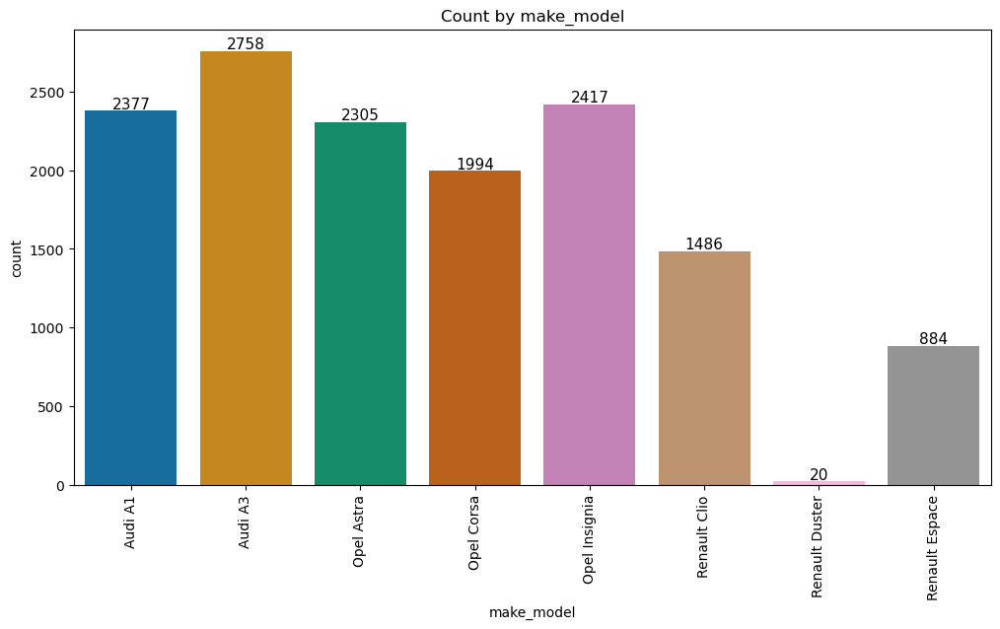

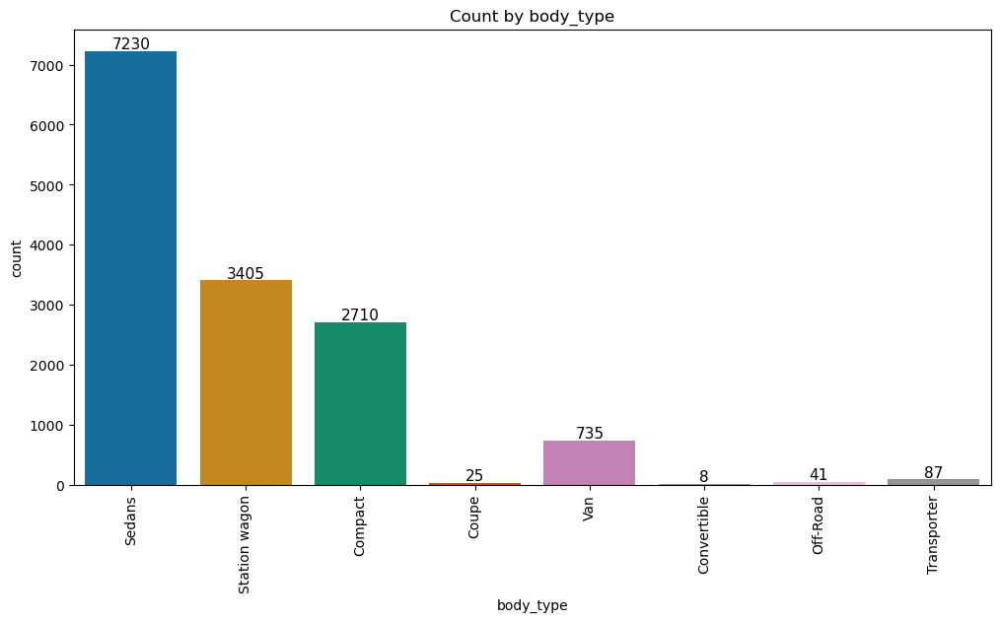

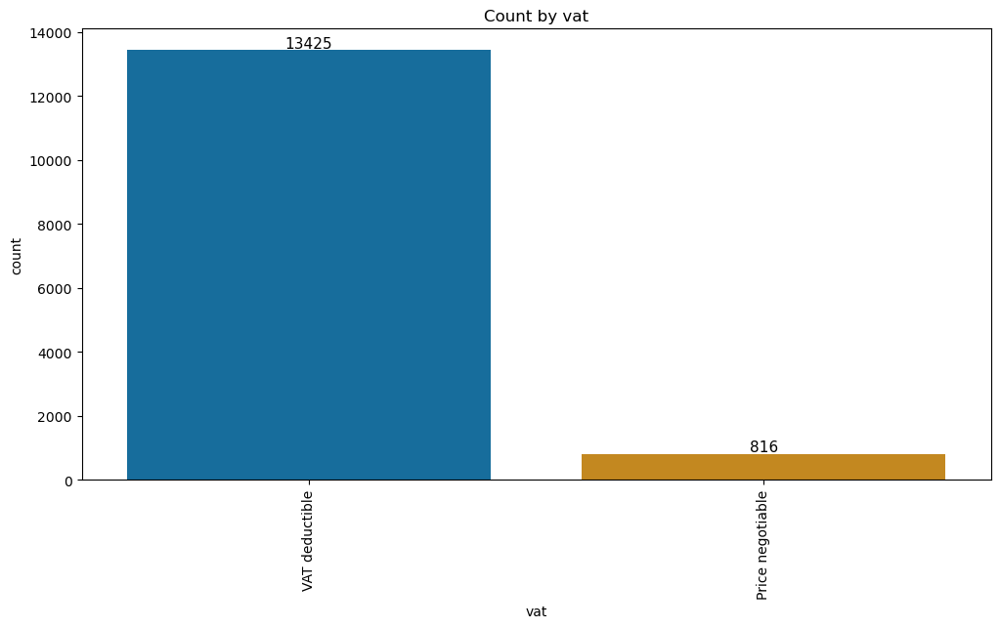

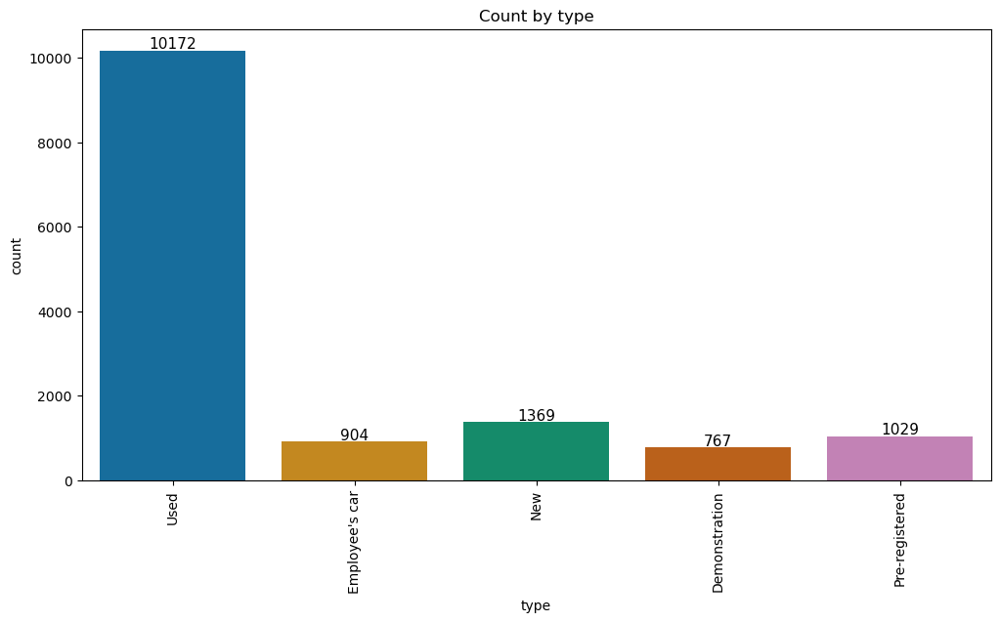

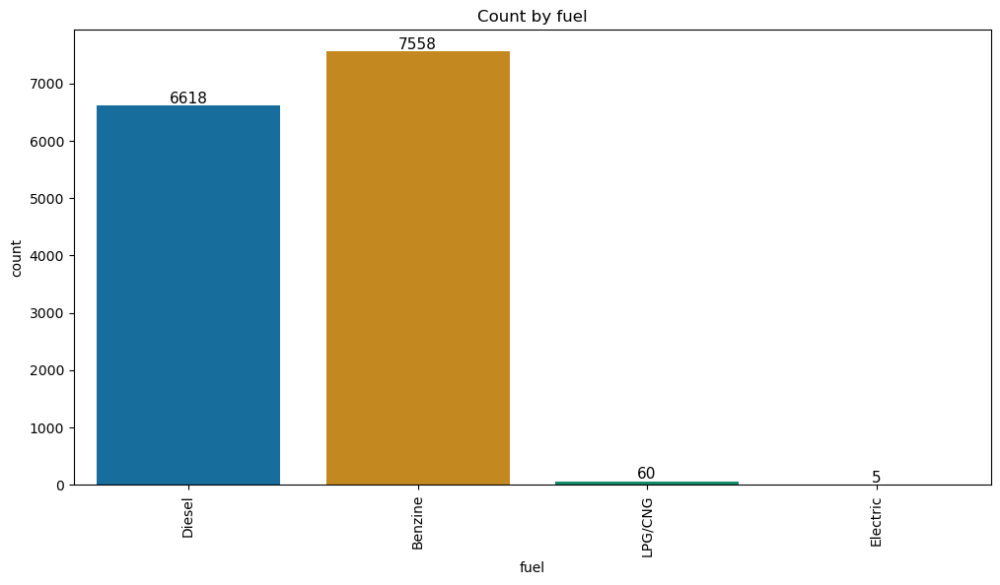

...

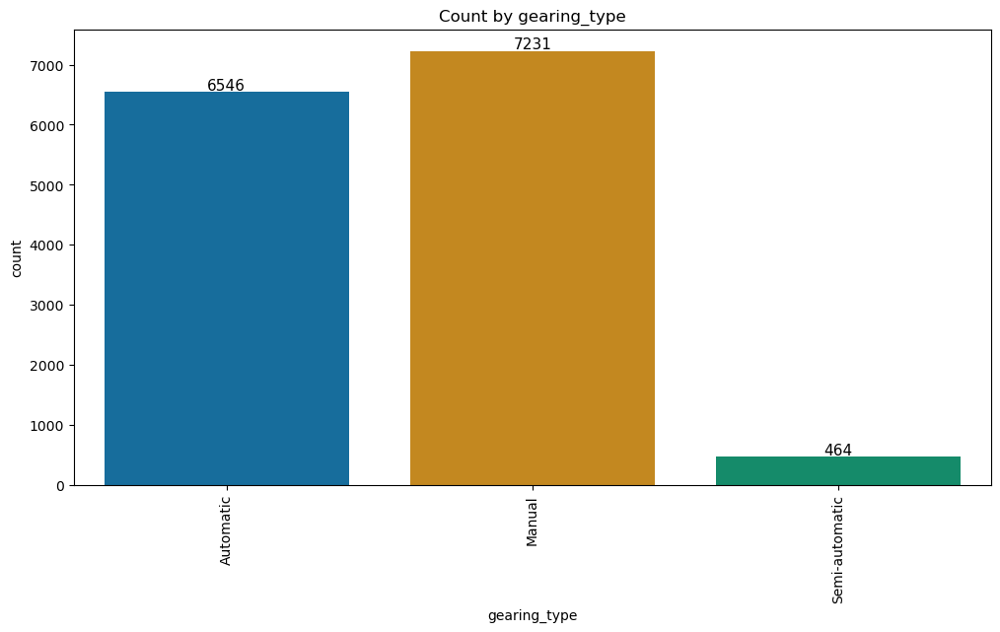

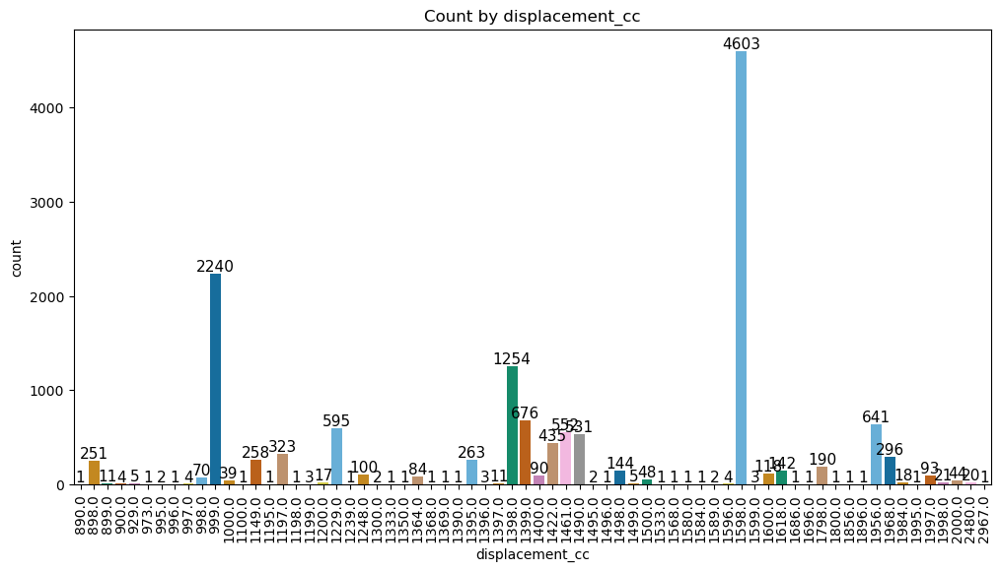

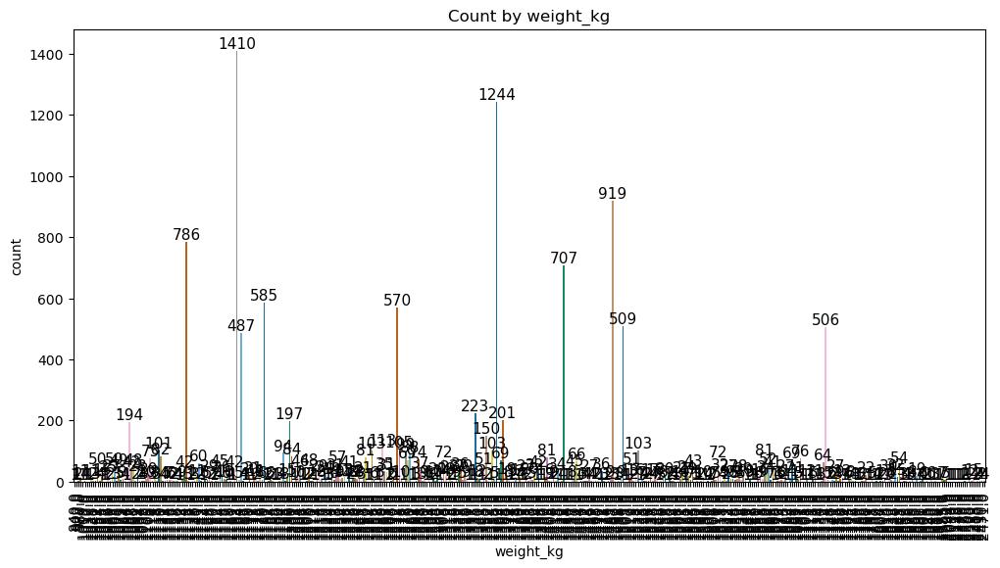

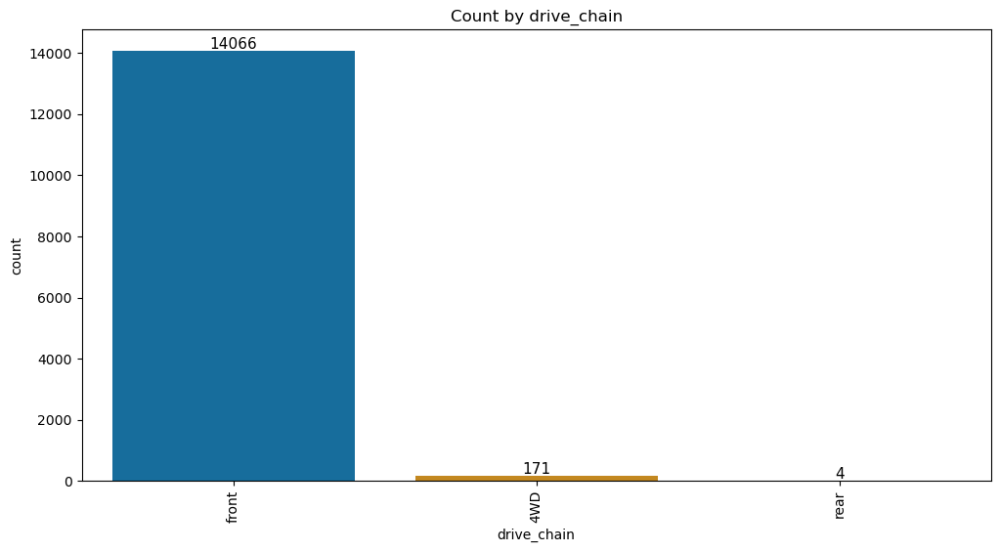

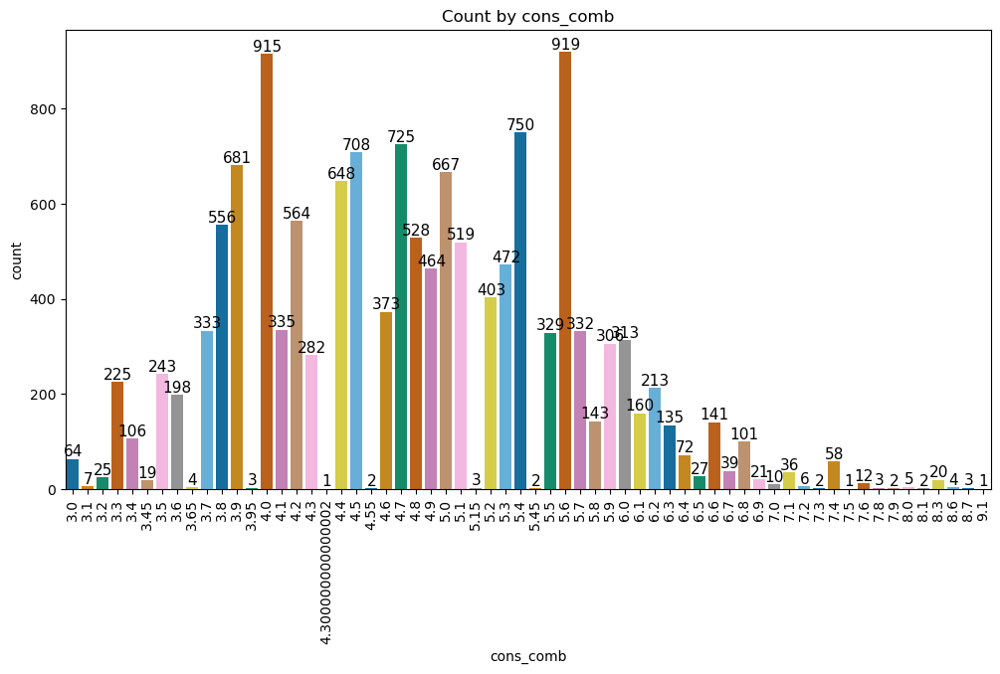

In [41]:

max_unique_values = 500

for col in df.columns:
    if col in df and df[col].nunique() <= max_unique_values:
        plt.figure(figsize=(12, 6))
        ax = sns.countplot(x=col, data= df, palette="colorblind")
        
        plt.title(f"Count by {col}")
        plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
        
        # Adding counts above each bar
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                        textcoords='offset points')
        
        plt.show()

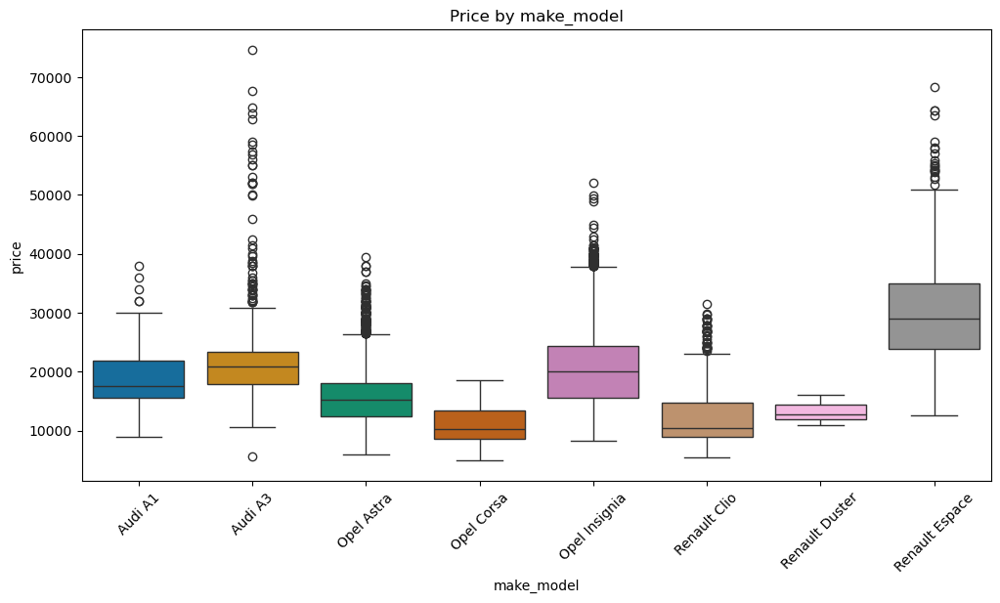

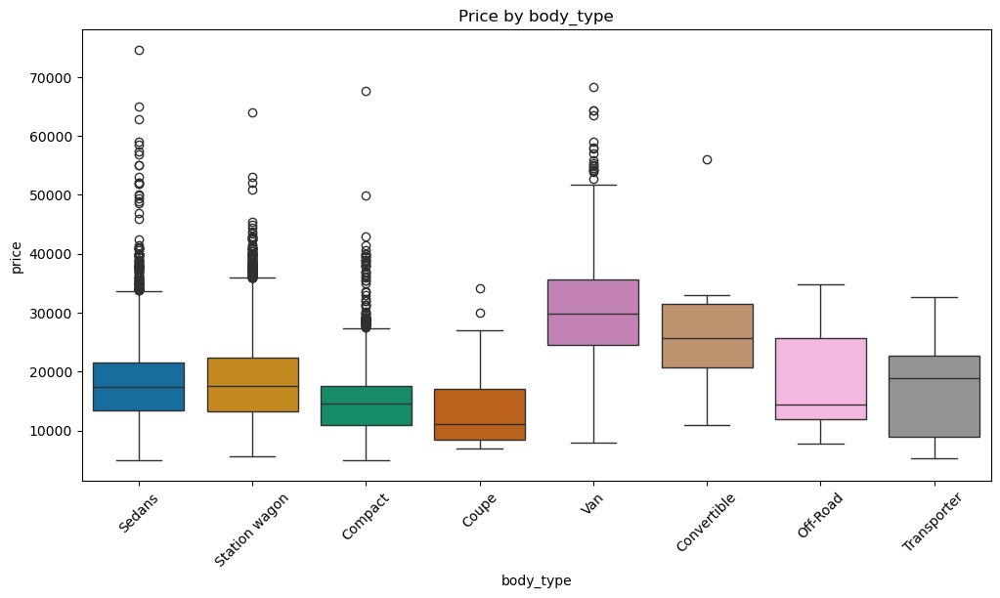

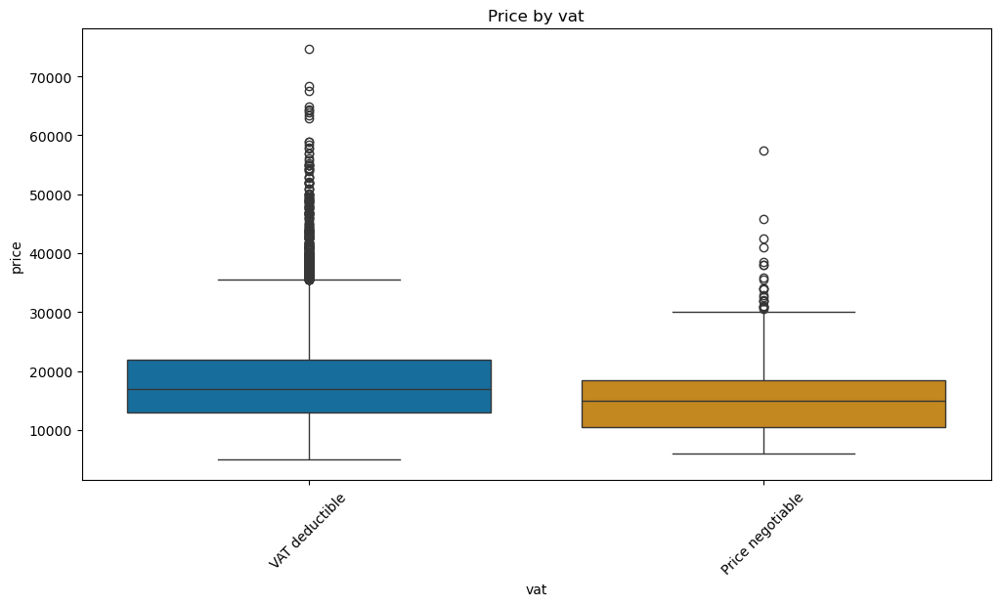

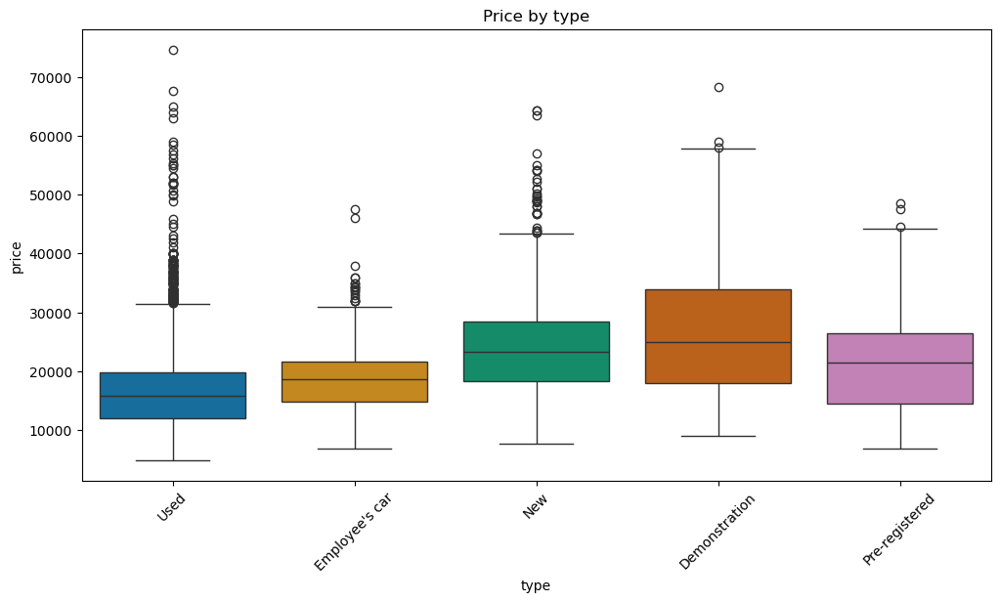

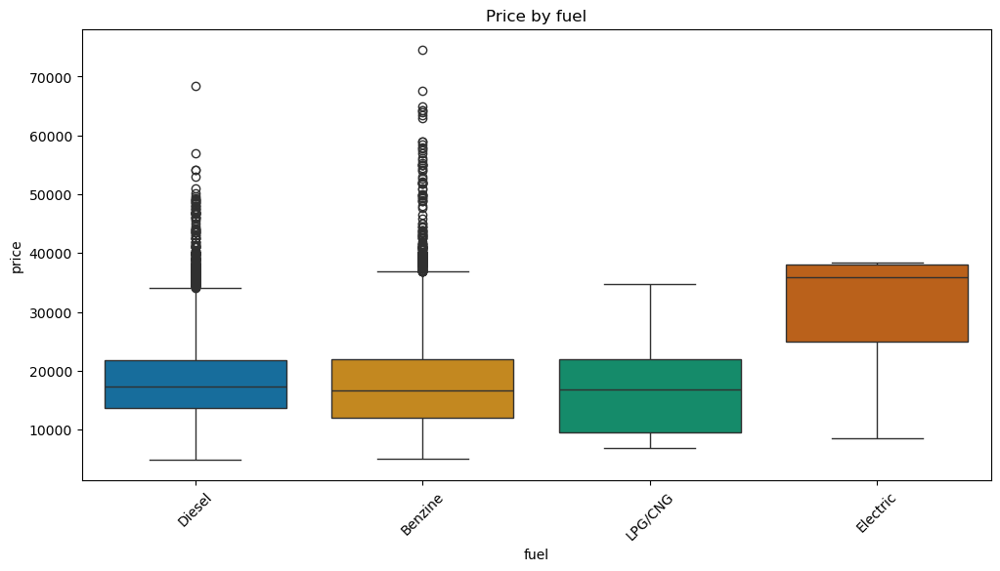

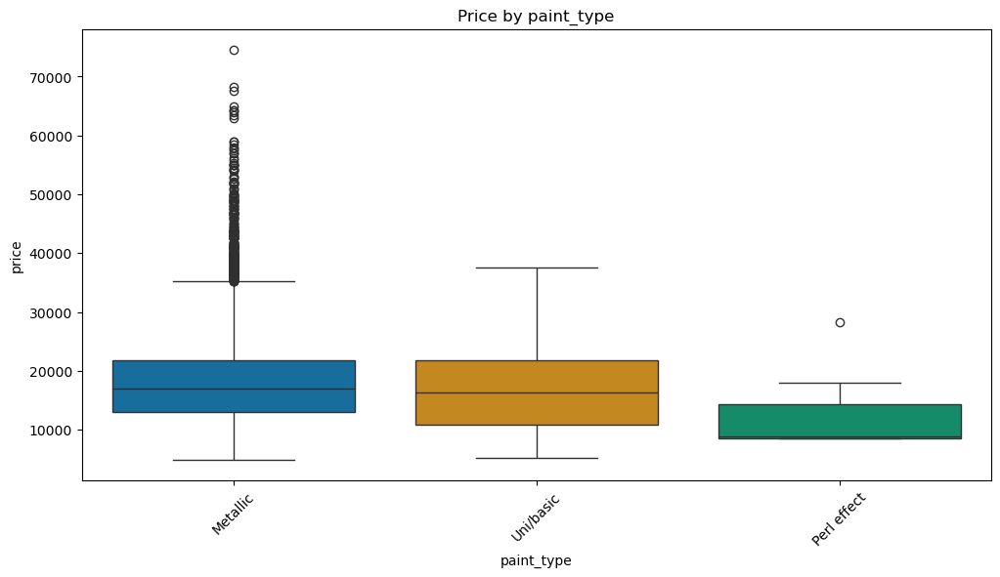

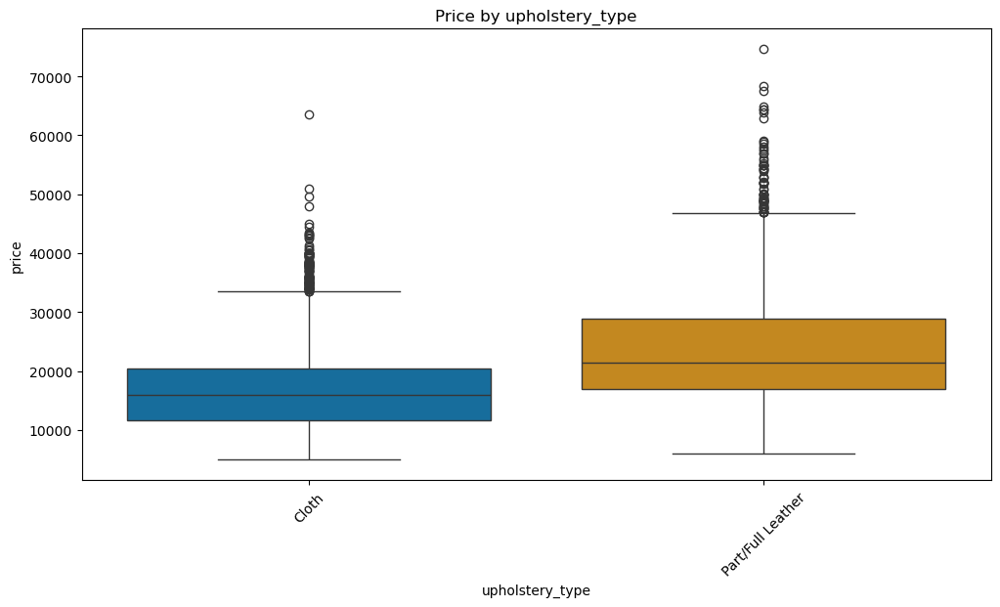

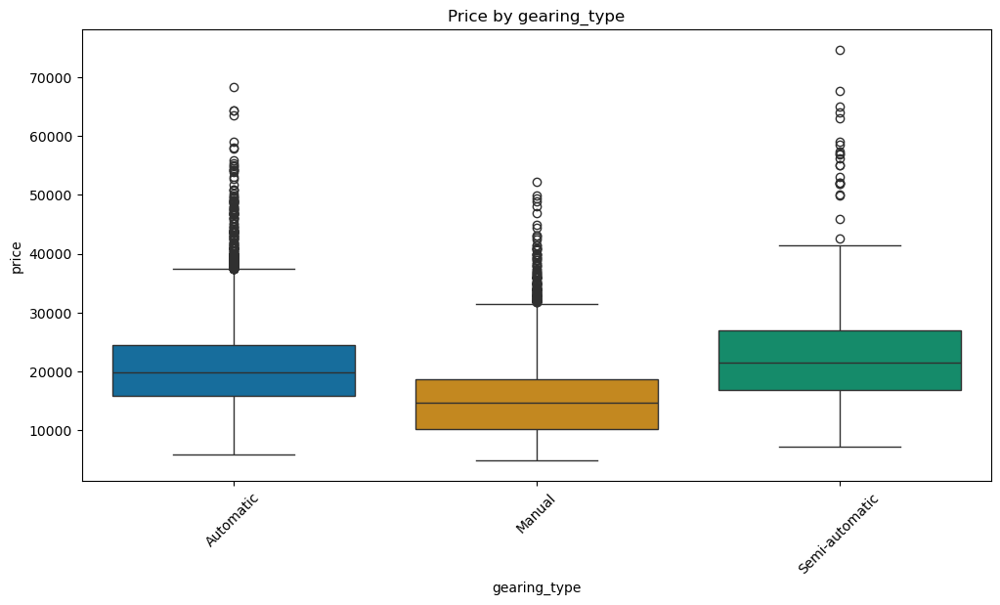

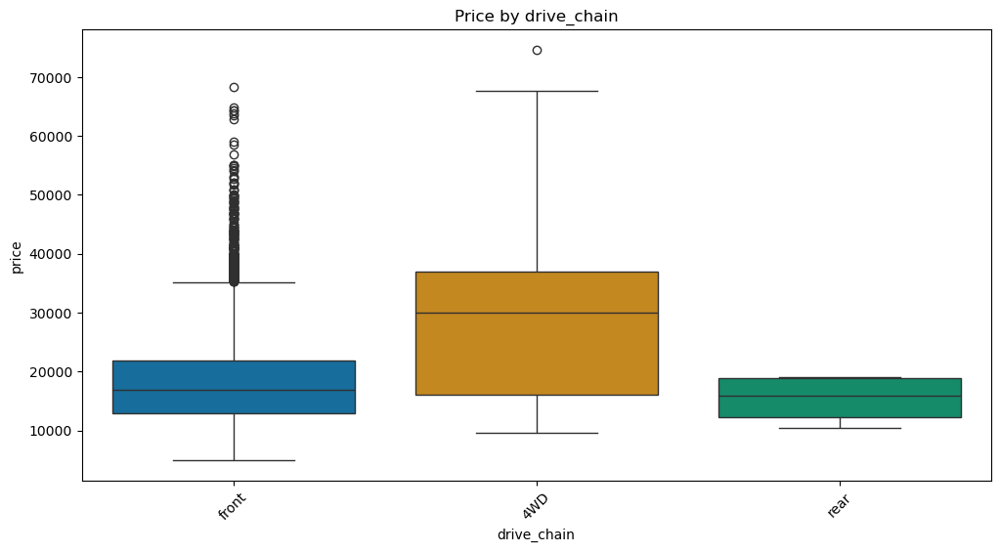

In [42]:
exclude_columns =  df.select_dtypes(include=['number']).columns.tolist()

# Optionally, you might want to limit the number of unique values for categorical plots
max_unique_values = 300

for col in df.columns:
    # Skip over the excluded columns and columns with too many unique values
    if col not in exclude_columns and df[col].nunique() <= max_unique_values:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=col, y="price", data=df, palette="colorblind")
        
        plt.title(f"Price by {col}")
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.show()

In [43]:
numeric_cols = df.select_dtypes(include=['number']).columns

for col_name in numeric_cols:
    
    column_skewness = skew(df[col_name].dropna())
    print(f"{col_name}: {column_skewness}")

price: 1.268654389014756
km: 1.6512957906438446
gears: 0.33090007535058663
age: 0.16010107322088987
previous_owners: 1.1033770930471951
hp_k_w: 1.3295084037365725
inspection_new: 1.1163673546520767
displacement_cc: -0.0756542745379683
weight_kg: 1.0686412461931392
cons_comb: 0.45754298973582824


**Since each of these values is close to +1, we can say that the distributions are slightly to moderately right-skewed. This may necessitate the application of some data transformations or normalization techniques during the data analysis and modeling process.**

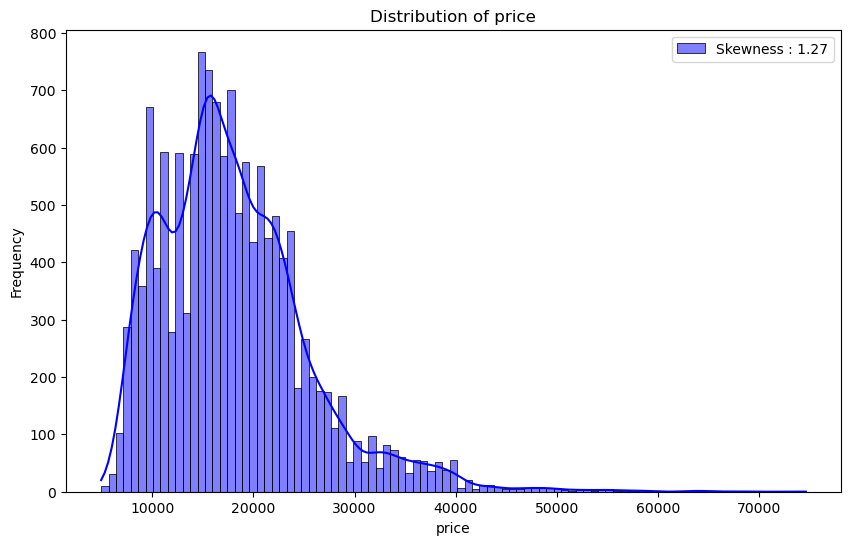

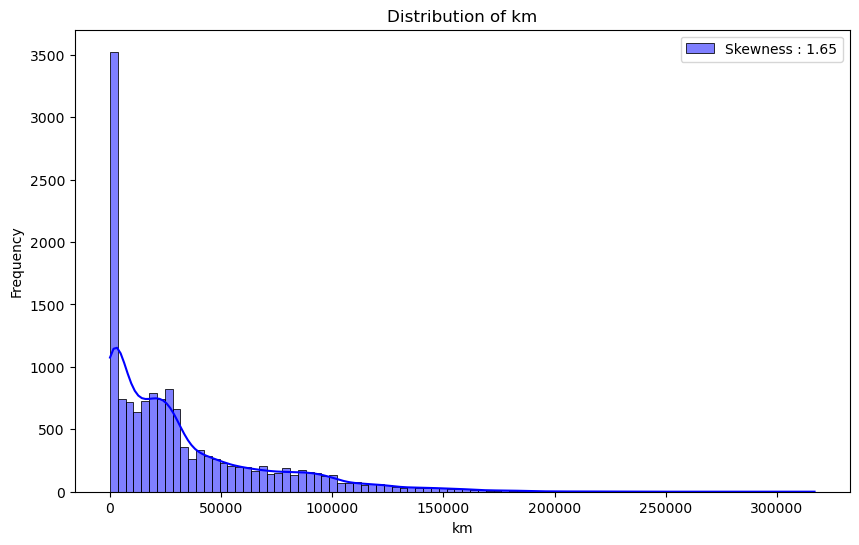

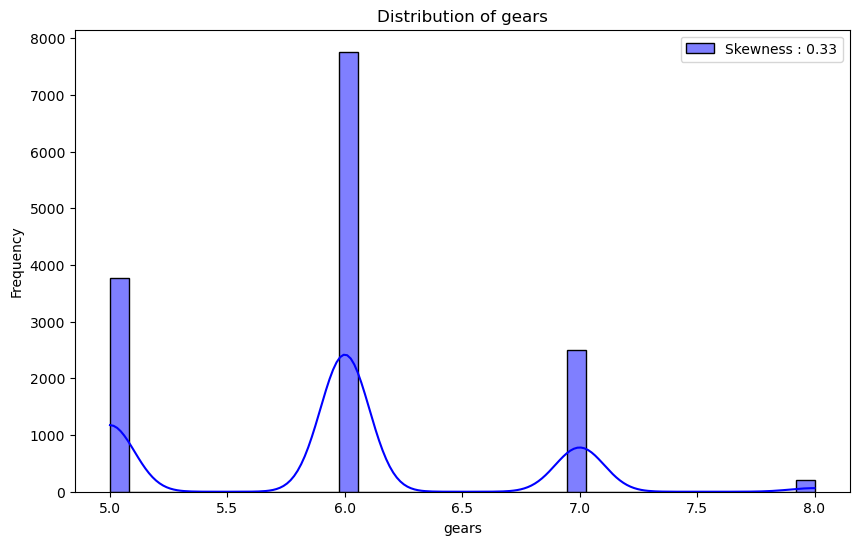

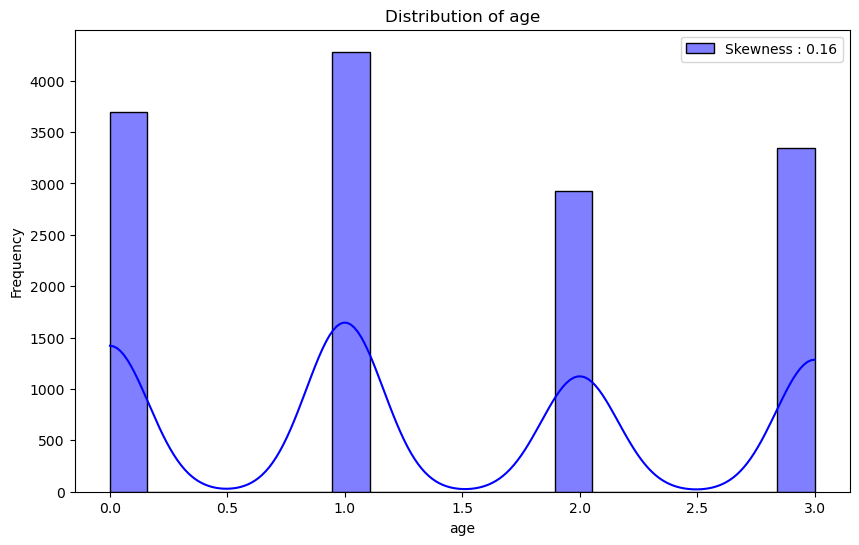

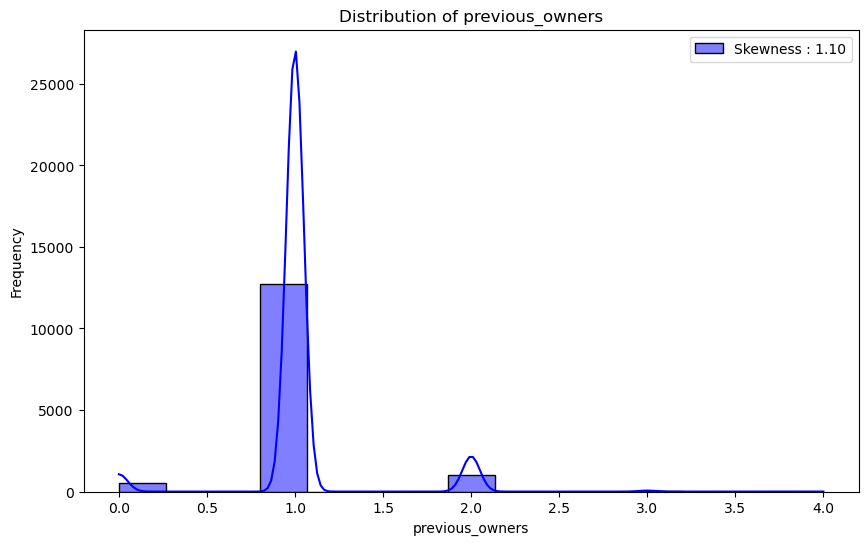

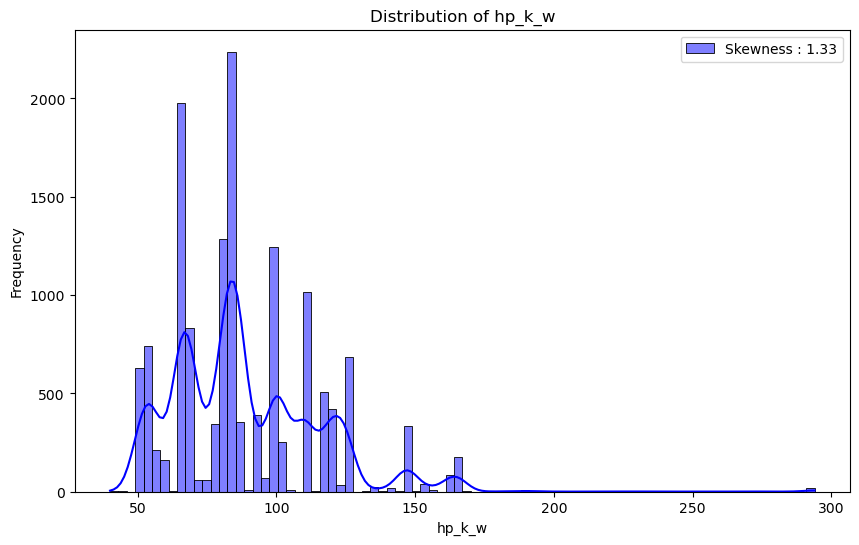

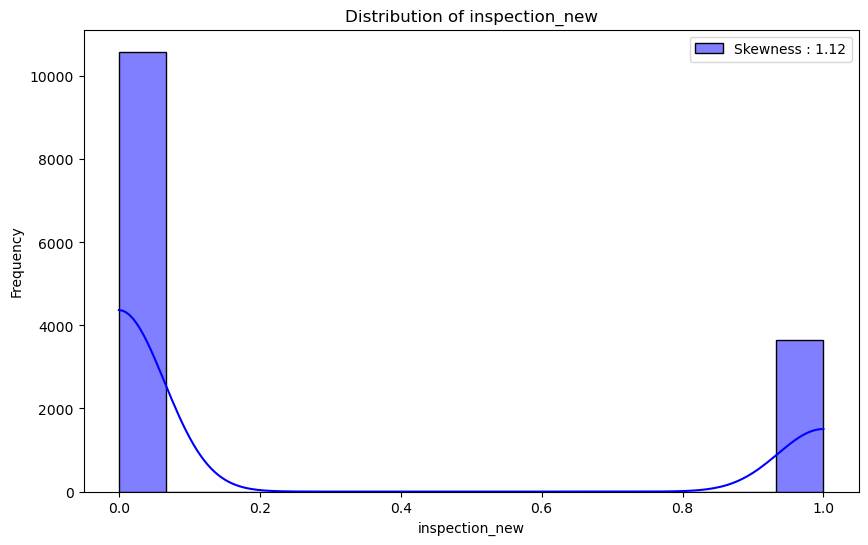

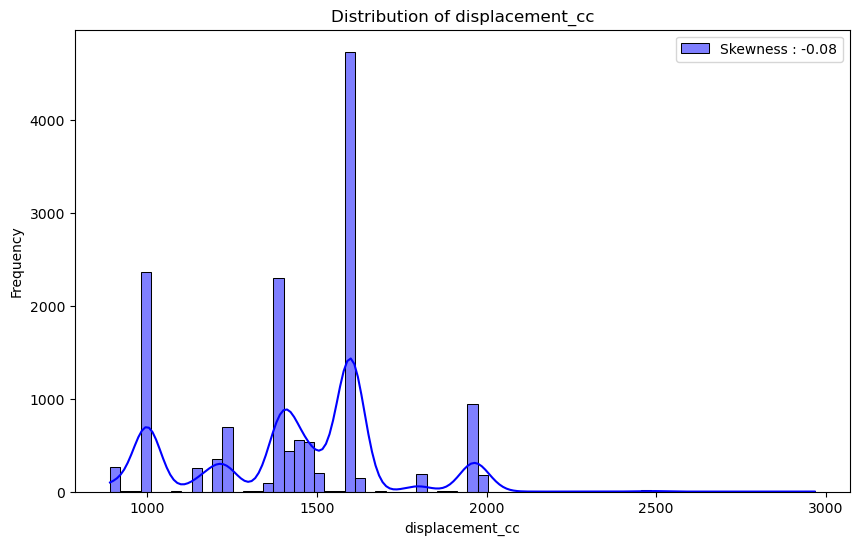

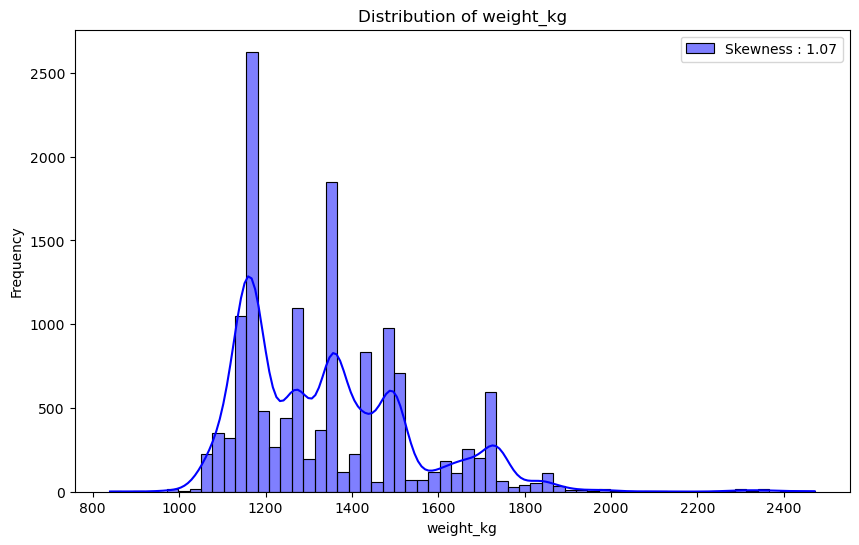

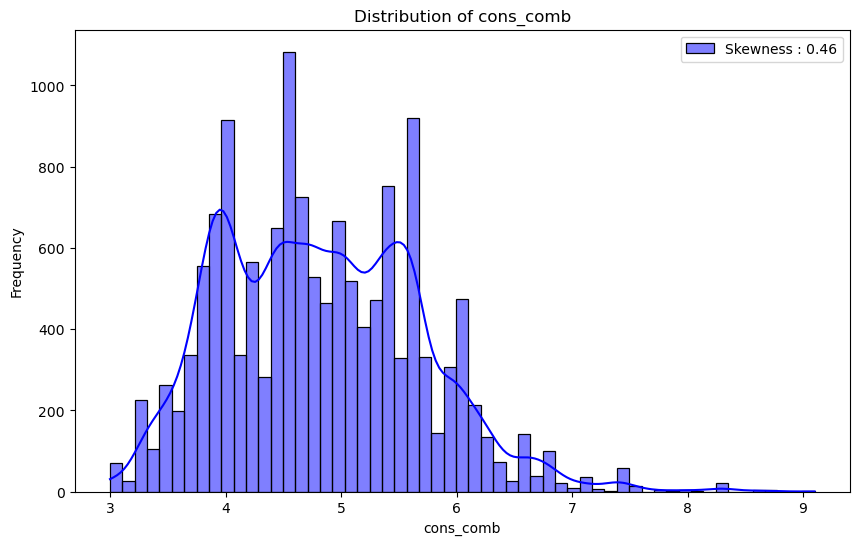

In [44]:
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
     
    g = sns.histplot(df[col], color="b", kde=True, label=f"Skewness : {df[col].skew():.2f}")
    
    plt.legend(loc="best")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [45]:
import plotly.graph_objects as go

# Assuming df_filtered is your DataFrame after dropping "CO2 Emissions(g/km)"
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
    # Step 1: Binning the data with qcut and ensuring no duplicate bins
    df[f"{col}_bin"] = pd.qcut(df[col], q=4, duplicates='drop')
    
    # Convert Interval objects to strings for Plotly compatibility
    df[f"{col}_bin_str"] = df[f"{col}_bin"].astype(str)
    
    # Step 2: Calculating proportions
    bin_counts = df[f"{col}_bin_str"].value_counts(normalize=True)
    
    # Step 3: Plotting with Plotly
    fig = go.Figure(data=[go.Pie(labels=bin_counts.index, values=bin_counts.values, title=f"Distribution of {col}")])
    
    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.show()

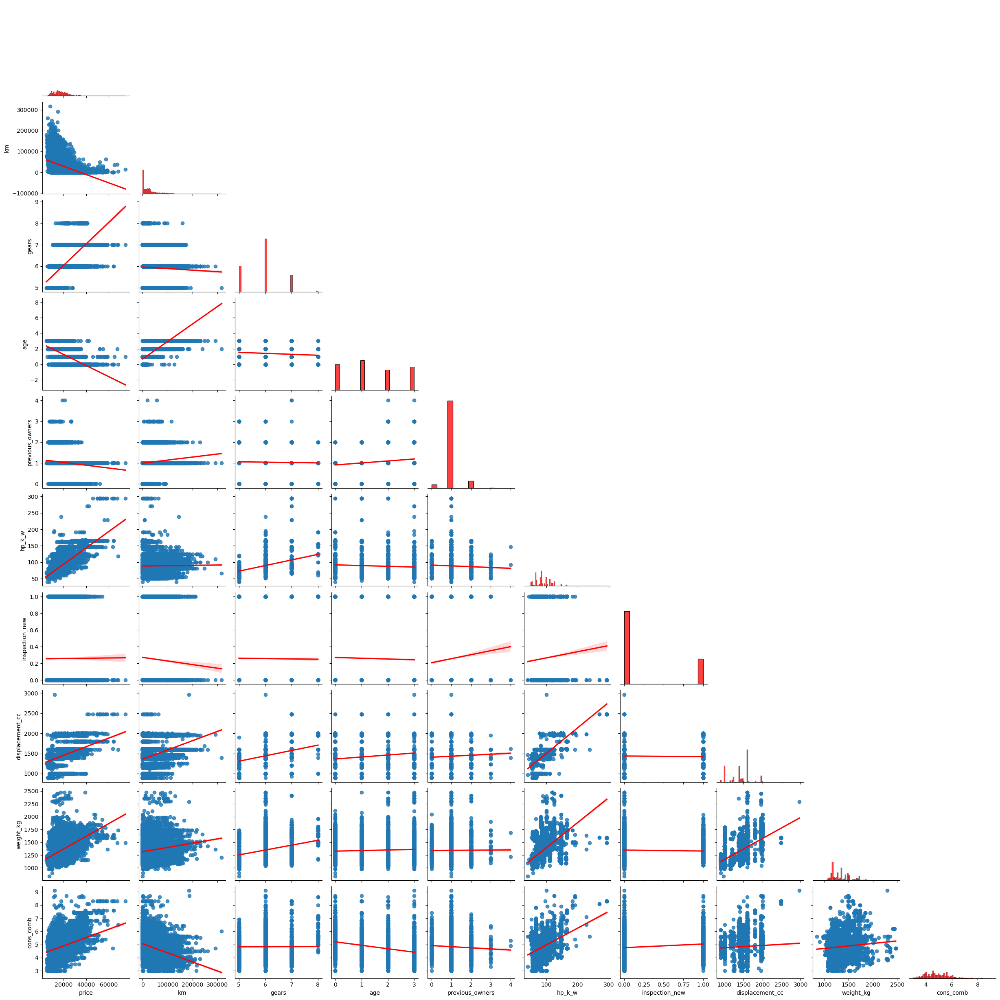

In [46]:
sns.pairplot(df, kind = "reg", diag_kind = "hist", diag_kws={"color":"red"}, plot_kws={"line_kws":{"color":"red"}},
             corner=True)

plt.show()

In [47]:
corr=df.corr(numeric_only=True)
corr

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.402383,0.528127,-0.481424,-0.148628,0.698043,0.002771,0.287021,0.460265,0.273561
km,-0.402383,1.000000,-0.038145,0.748734,0.158775,0.013365,-0.036472,0.305740,0.152797,-0.295296
gears,0.528127,-0.038145,1.000000,-0.079296,-0.036679,0.451228,-0.006482,0.337764,0.332289,0.006956
age,-0.481424,0.748734,-0.079296,1.000000,0.314147,-0.092952,-0.023629,0.197629,0.061158,-0.339086
previous_owners,-0.148628,0.158775,-0.036679,0.314147,1.000000,-0.031628,0.037223,0.030033,0.003690,-0.033281
hp_k_w,0.698043,0.013365,0.451228,-0.092952,-0.031628,1.000000,0.044698,0.605772,0.641306,0.391021
inspection_new,0.002771,-0.036472,-0.006482,-0.023629,0.037223,0.044698,1.000000,-0.023916,-0.040937,0.141964
displacement_cc,0.287021,0.305740,0.337764,0.197629,0.030033,0.605772,-0.023916,1.000000,0.566900,0.055187
weight_kg,0.460265,0.152797,0.332289,0.061158,0.003690,0.641306,-0.040937,0.566900,1.000000,0.088582
cons_comb,0.273561,-0.295296,0.006956,-0.339086,-0.033281,0.391021,0.141964,0.055187,0.088582,1.000000


In [48]:
def color_correlation1(val):
    """
    Takes a scalar and returns a string with
    the css property in a variety of color scales 
    for different correlations.
    """
    if val >= 0.6 and val < 0.99999 or val <= -0.6 and val > -0.99999:
        color = 'red'
    elif val < 0.6 and val >= 0.3 or val > -0.6 and val <= -0.3:
        color = 'blue'
    elif val == 1:
        color = 'green'    
    else:
        color = 'black'
    return 'color: %s' % color

numeric_df = df.select_dtypes(include=[np.number])

numeric_df.corr().style.applymap(color_correlation1)



,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.402383,0.528127,-0.481424,-0.148628,0.698043,0.002771,0.287021,0.460265,0.273561
km,-0.402383,1.000000,-0.038145,0.748734,0.158775,0.013365,-0.036472,0.305740,0.152797,-0.295296
gears,0.528127,-0.038145,1.000000,-0.079296,-0.036679,0.451228,-0.006482,0.337764,0.332289,0.006956
age,-0.481424,0.748734,-0.079296,1.000000,0.314147,-0.092952,-0.023629,0.197629,0.061158,-0.339086
previous_owners,-0.148628,0.158775,-0.036679,0.314147,1.000000,-0.031628,0.037223,0.030033,0.003690,-0.033281
hp_k_w,0.698043,0.013365,0.451228,-0.092952,-0.031628,1.000000,0.044698,0.605772,0.641306,0.391021
inspection_new,0.002771,-0.036472,-0.006482,-0.023629,0.037223,0.044698,1.000000,-0.023916,-0.040937,0.141964
displacement_cc,0.287021,0.305740,0.337764,0.197629,0.030033,0.605772,-0.023916,1.000000,0.566900,0.055187
weight_kg,0.460265,0.152797,0.332289,0.061158,0.003690,0.641306,-0.040937,0.566900,1.000000,0.088582
cons_comb,0.273561,-0.295296,0.006956,-0.339086,-0.033281,0.391021,0.141964,0.055187,0.088582,1.000000


In [49]:
def color_red(val):
    if val > 0.60 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "yellowgreen"
    else:
        color = 'white'
    return f'background-color: {color}'
pd.DataFrame(corr).style.applymap(color_red)

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.402383,0.528127,-0.481424,-0.148628,0.698043,0.002771,0.287021,0.460265,0.273561
km,-0.402383,1.000000,-0.038145,0.748734,0.158775,0.013365,-0.036472,0.305740,0.152797,-0.295296
gears,0.528127,-0.038145,1.000000,-0.079296,-0.036679,0.451228,-0.006482,0.337764,0.332289,0.006956
age,-0.481424,0.748734,-0.079296,1.000000,0.314147,-0.092952,-0.023629,0.197629,0.061158,-0.339086
previous_owners,-0.148628,0.158775,-0.036679,0.314147,1.000000,-0.031628,0.037223,0.030033,0.003690,-0.033281
hp_k_w,0.698043,0.013365,0.451228,-0.092952,-0.031628,1.000000,0.044698,0.605772,0.641306,0.391021
inspection_new,0.002771,-0.036472,-0.006482,-0.023629,0.037223,0.044698,1.000000,-0.023916,-0.040937,0.141964
displacement_cc,0.287021,0.305740,0.337764,0.197629,0.030033,0.605772,-0.023916,1.000000,0.566900,0.055187
weight_kg,0.460265,0.152797,0.332289,0.061158,0.003690,0.641306,-0.040937,0.566900,1.000000,0.088582
cons_comb,0.273561,-0.295296,0.006956,-0.339086,-0.033281,0.391021,0.141964,0.055187,0.088582,1.000000


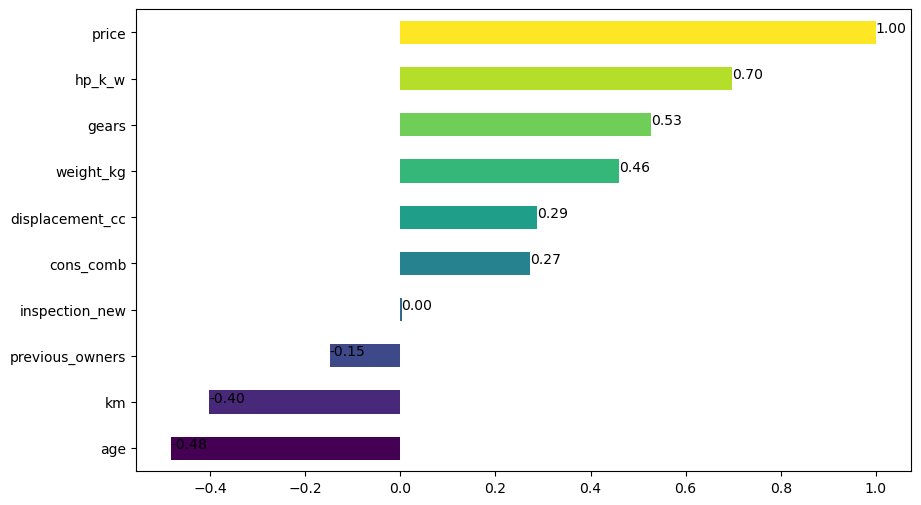

In [50]:
corr_values = numeric_df.corr()["price"].sort_values()
colors = plt.cm.viridis(np.linspace(0, 1, len(corr_values)))

ax = corr_values.plot.barh(color=colors)
for index, value in enumerate(corr_values):
    plt.text(value, index, "{:.2f}".format(value))

plt.show()

In [51]:
R2_score = corr**2 

In [52]:
def color_red(val):
    if val > 0.50 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "yellowgreen"
    else:
        color = 'white'
    return f'background-color: {color}'
pd.DataFrame.corr(R2_score).style.applymap(color_red)

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.027887,0.307319,0.055030,-0.264089,0.573078,-0.305581,-0.057667,0.180856,-0.129523
km,-0.027887,1.000000,-0.297063,0.794370,-0.124896,-0.395463,-0.209774,-0.180188,-0.315824,-0.037937
gears,0.307319,-0.297063,1.000000,-0.297324,-0.217419,0.202626,-0.201385,0.017246,0.047562,-0.233349
age,0.055030,0.794370,-0.297324,1.000000,-0.022737,-0.403126,-0.223446,-0.287769,-0.370774,-0.004504
previous_owners,-0.264089,-0.124896,-0.217419,-0.022737,1.000000,-0.322782,-0.130273,-0.256140,-0.264695,-0.175941
hp_k_w,0.573078,-0.395463,0.202626,-0.403126,-0.322782,1.000000,-0.290721,0.449229,0.572356,-0.042844
inspection_new,-0.305581,-0.209774,-0.201385,-0.223446,-0.130273,-0.290721,1.000000,-0.233980,-0.235414,-0.126514
displacement_cc,-0.057667,-0.180188,0.017246,-0.287769,-0.256140,0.449229,-0.233980,1.000000,0.460380,-0.250148
weight_kg,0.180856,-0.315824,0.047562,-0.370774,-0.264695,0.572356,-0.235414,0.460380,1.000000,-0.240580
cons_comb,-0.129523,-0.037937,-0.233349,-0.004504,-0.175941,-0.042844,-0.126514,-0.250148,-0.240580,1.000000


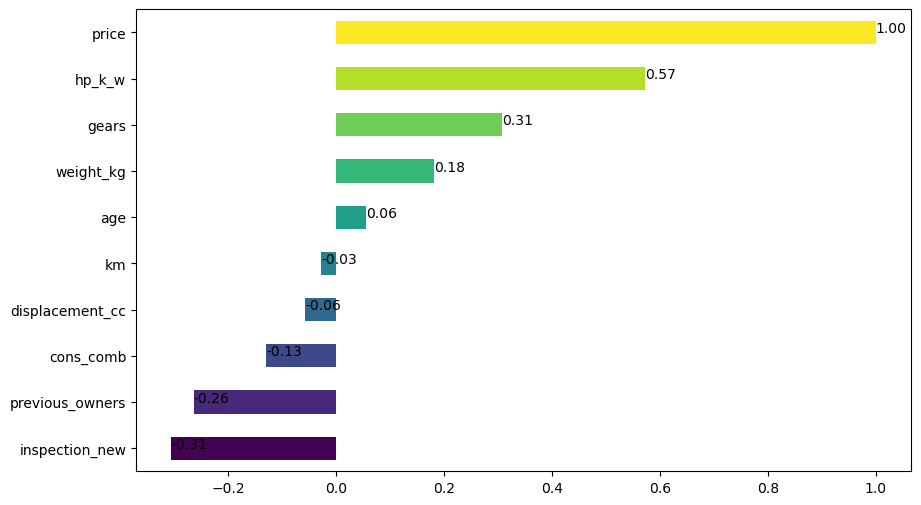

In [53]:
corr_values = pd.DataFrame.corr(R2_score)["price"].sort_values()
colors = plt.cm.viridis(np.linspace(0, 1, len(corr_values)))

ax = corr_values.plot.barh(color=colors)
for index, value in enumerate(corr_values):
    plt.text(value, index, "{:.2f}".format(value))

plt.show()

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Get Dummies</b>
</h2>

In [54]:
# Bu kod, sütunlarımızdaki her bir hücrede yer alan virgülle ayrılmış metinleri ayrıştırarak,
# bu metinlerin her bir öğesinin ayrı bir sütun olarak temsil edildiği yeni bir veri çerçevesi oluşturur.

df = df.join(df["comfort_convenience"].str.get_dummies(sep = ",").add_prefix("cc_"))
df = df.join(df["entertainment_media"].str.get_dummies(sep = ",").add_prefix("em_"))
df = df.join(df["extras"].str.get_dummies(sep = ",").add_prefix("ex_"))
df = df.join(df["safety_security"].str.get_dummies(sep = ",").add_prefix("ss_"))

In [55]:
df.drop(["comfort_convenience","entertainment_media","extras","safety_security"], axis=1, inplace=True)

In [56]:
df = pd.get_dummies(df, drop_first =True)

# drop_first=True parametresi, her bir özelliğin ilk kategorisine ait sütunu kaldırır. 
# Bu, overfitting ve multicollinarity önlemek için yapılır.

# Örneğin, "Fuel_Type" sütununda "Diesel", "Gasoline" ve "LPG" gibi üç kategori varsa, sütunlardan sadece ikisi
# (örneğin "Gasoline" ve "LPG") kodlanır ve "Diesel" kategorisi için referans olarak kullanılır.
# Bu sayede, "Gasoline" sütunu ve "LPG" sütunu, "Diesel" sütunu ile ilişkilendirilir ve herhangi bir çoklu doğrusal
# bağımsızlık sorununun önlenmesi sağlanır.
# Pandas versiyon farkından kaynaklı True/False yerine 0/1 olarak görüntülenebilir

In [57]:
# DataFrame'indeki boolean değerleri integer'a dönüştürür

bool_columns = df.columns[df.dtypes == 'bool']
df[bool_columns] = df[bool_columns].astype(int)

In [58]:
df.head()

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb,cc_Air conditioning,cc_Air suspension,cc_Armrest,cc_Automatic climate control,cc_Auxiliary heating,cc_Cruise control,cc_Electric Starter,cc_Electric tailgate,cc_Electrical side mirrors,cc_Electrically adjustable seats,cc_Electrically heated windshield,cc_Heads-up display,cc_Heated steering wheel,cc_Hill Holder,cc_Keyless central door lock,cc_Leather seats,cc_Leather steering wheel,cc_Light sensor,cc_Lumbar support,cc_Massage seats,cc_Multi-function steering wheel,cc_Navigation system,cc_Panorama roof,cc_Park Distance Control,cc_Parking assist system camera,cc_Parking assist system self-steering,cc_Parking assist system sensors front,cc_Parking assist system sensors rear,cc_Power windows,cc_Rain sensor,cc_Seat heating,cc_Seat ventilation,cc_Split rear seats,cc_Start-stop system,cc_Sunroof,cc_Tinted windows,cc_Wind deflector,cc_Windshield,em_Bluetooth,em_CD player,...,paint_type_Uni/basic,upholstery_type_Part/Full Leather,gearing_type_Manual,gearing_type_Semi-automatic,drive_chain_front,drive_chain_rear,"price_bin_(12950.0, 16950.0]","price_bin_(16950.0, 21900.0]","price_bin_(21900.0, 74600.0]","price_bin_str_(16950.0, 21900.0]","price_bin_str_(21900.0, 74600.0]","price_bin_str_(4949.999, 12950.0]","km_bin_(3898.0, 21000.0]","km_bin_(21000.0, 47000.0]","km_bin_(47000.0, 317000.0]","km_bin_str_(21000.0, 47000.0]","km_bin_str_(3898.0, 21000.0]","km_bin_str_(47000.0, 317000.0]","gears_bin_(6.0, 8.0]","gears_bin_str_(6.0, 8.0]","age_bin_(1.0, 2.0]","age_bin_(2.0, 3.0]","age_bin_str_(1.0, 2.0]","age_bin_str_(2.0, 3.0]","previous_owners_bin_(1.0, 4.0]","previous_owners_bin_str_(1.0, 4.0]","hp_k_w_bin_(66.0, 85.0]","hp_k_w_bin_(85.0, 103.0]","hp_k_w_bin_(103.0, 294.0]","hp_k_w_bin_str_(39.999, 66.0]","hp_k_w_bin_str_(66.0, 85.0]","hp_k_w_bin_str_(85.0, 103.0]","displacement_cc_bin_(1229.0, 1461.0]","displacement_cc_bin_(1461.0, 1598.0]","displacement_cc_bin_(1598.0, 2967.0]","displacement_cc_bin_str_(1461.0, 1598.0]","displacement_cc_bin_str_(1598.0, 2967.0]","displacement_cc_bin_str_(889.999, 1229.0]","weight_kg_bin_(1165.0, 1320.0]","weight_kg_bin_(1320.0, 1487.0]","weight_kg_bin_(1487.0, 2471.0]","weight_kg_bin_str_(1320.0, 1487.0]","weight_kg_bin_str_(1487.0, 2471.0]","weight_kg_bin_str_(839.999, 1165.0]","cons_comb_bin_(4.1, 4.8]","cons_comb_bin_(4.8, 5.4]","cons_comb_bin_(5.4, 9.1]","cons_comb_bin_str_(4.1, 4.8]","cons_comb_bin_str_(4.8, 5.4]","cons_comb_bin_str_(5.4, 9.1]"
0,15770,56013.0,7.0,3.0,2.0,66.0,1,1422.0,1220.0,3.8,1,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,14500,80000.0,7.0,2.0,1.0,141.0,0,1798.0,1255.0,5.6,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
2,14640,83450.0,7.0,3.0,1.0,85.0,0,1598.0,1135.0,3.8,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,1,1,1,0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,14500,73000.0,6.0,3.0,1.0,66.0,0,1422.0,1195.0,3.8,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,1,1,0,0,0,0,0,0,1,1,1,0,1,1,0,0,0,0,1,1,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,16790,16200.0,7.0,3.0,1.0,66.0,1,1422.0,1135.0,4.1,1,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,1,1,...,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [59]:
df.shape

(14241, 177)

In [60]:
df.isnull().any().any()

False

In [61]:
corr_by_price = df.corr()["price"].sort_values()[:-1]
corr_by_price

# datamızdaki tüm featurların target ile olan corr.larına bakıyoruz
# targetımız olan price ile corr.larını küçükten büyüğe sıralıyoruz. 
# Targetın kendisiyle olan corr.unu görmek istemediğimizden slicelama ([:-1]) yapıp -1 ile targetı ignore ediyoruz

price_bin_str_(4949.999, 12950.0]     -0.629680
hp_k_w_bin_str_(39.999, 66.0]         -0.515311
age                                   -0.481424
gearing_type_Manual                   -0.424192
weight_kg_bin_str_(839.999, 1165.0]   -0.422387
                                         ...   
hp_k_w_bin_(103.0, 294.0]              0.522868
gears                                  0.528127
hp_k_w                                 0.698043
price_bin_str_(21900.0, 74600.0]       0.765395
price_bin_(21900.0, 74600.0]           0.765395
Name: price, Length: 176, dtype: float64

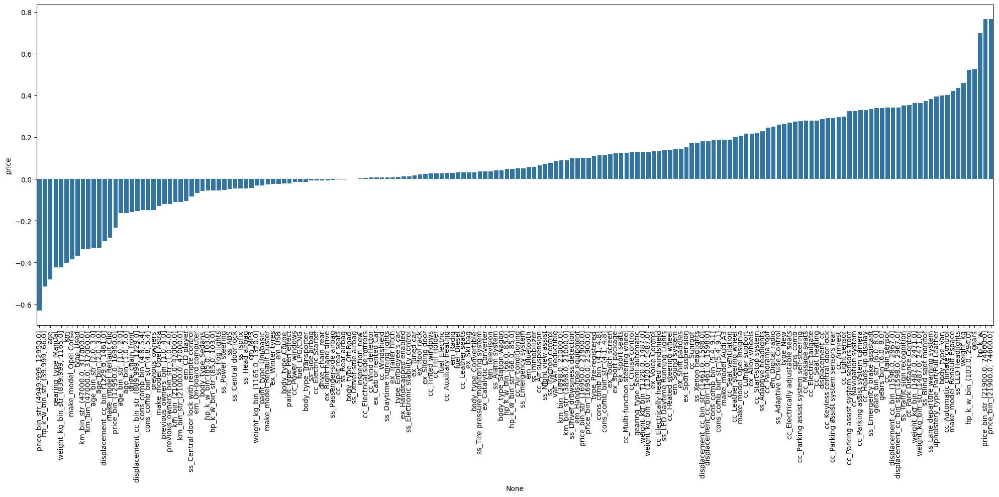

In [62]:
plt.figure(figsize = (20,10))
sns.barplot(x = corr_by_price.index, y = corr_by_price)
plt.xticks(rotation=90)
plt.tight_layout();

# featureler ile target arasındaki corr.ları görselleştiriyoruz.

<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>EDA</b>
</h1>

Since each of these values is close to +1, we can say that the distributions are slightly to moderately right-skewed. This may necessitate the application of some data transformations or normalization techniques during the data analysis and modeling process.

In [63]:
from summarytools import dfSummary
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,price[int64],Mean (sd) : 18100.3 (7421.0)min < med < max:4950.0 < 16950.0 < 74600.0IQR (CV) : 8950.0 (2.4),"2,952 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACcUlEQVR4nO3dvY7aQBSG4TOwIPMTI4QEHU3KSCkouYhcbNp0KbiCbVPRICQERjjrYIxTUWWzCzYO8znv049x8Qp2FubY5XlugO8aj74B4BpPVV7cOdcxs3aJSxzzPH+51/1AV2WhOuc6o9HoSxiGw6LX2O/3W+fcV2JFle+o7TAMh/P5/GUwGCS3Lo6iKFgsFsPNZtM2M0L9z1X60W9mNhgMkvF4/LPg8s5dbway2ExBAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCAqFCQuW/8C8jy7KWmYXOuSLLORhYI96GGsdxK03Tz9PptNlsNm8+c8XBwHrxNtTj8fgUBEF3Npslk8lke8taDgbWj7ehXvR6vaKHAzkYWCNspiCBUCGBUCGBUCGBUCGBUCHh3X9PlRgdGZ7P51aBdcAf3gy1zOjINE2DLMs+JUny3cyKDkkDzOz9d9TCoyOXy+Xw+fm5ezqdmiXuDzCzK7+ZKjI6crvd8s0Q7obNFCQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiQQKiR4P82vqJJDgM0YBOyVWoZadgiwGYOAfVPLUMsMATZjELCPahnqRYkhwGYMAvYKmylIIFRIIFRIqPXfqGXwjCu/EOoreMaVfwj1FTzjyj+E+gaeceUPNlOQwDtqBUpuxBpmdi7x8rXcyF0VahRFwa0XPhwOgZlZHMfBer3u/sv1j3zt1Wr1oehGLMuyVhzHH/v9/o9Go5HesvZit9sdnHPfzKzQbxwe6Fee53+959/eswJQuNZ63wAAAABJRU5ErkJggg=="">",0(0.0%)
2,km[float64],Mean (sd) : 32582.6 (36858.1)min < med < max:0.0 < 21000.0 < 317000.0IQR (CV) : 43102.0 (0.9),"6,690 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACR0lEQVR4nO3dvW7aUBiH8feUBBmIDIjKbF7ZOjCy9A56sVm7e+c2kAy2hQMBWe6ULv0AjkPjv/v8Zs7BSI/88coSrq5rA9ru00cfAHCNh0sfcM4NzKzvuf+pruuD51rgp7+G6pwbzGazb2EYTn02L4pi55x7JlY0demM2g/DcLparQ7j8fh4y8Z5ngdJkkzTNO2bGaGikYuXfjOz8Xh8jKLoxWP/gcca4Bc8TEECoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoUICoULCVX+D7quqqkczC51zvluc6ro+vOMhQdTdQi3L8vF8Pn+J47jX6/WOPnsURbFzzj0TK+4W6ul0egiCYLhcLo/z+Xx36/o8z4MkSaZpmvbNjFD/c3e99JuZjUajYxRFL57LB+96MJDFwxQkECokECok3P0etYmG4y1GWx3S2lCbjrcYbXVLa0NtMt5itNU9rQ31TYPxFqOtDuFhChJaf0b1xXsG3dLJUHnPoHs6GSrvGXRPJ0N90+Q9g6qqQmOG2xqdDtVX01uHLMv2zrnvZuZz20Hkv3FVqHmeB7duvN/vAzOzsiyDzWYz/Jfrm373drt9CoJguFgs3GQyeb1lbZZlT+v1+mscx58/IHJlr3Vd//E3/wCjDuekf0pGDwAAAABJRU5ErkJggg=="">",0(0.0%)
3,gears[float64],1. 6.02. 5.03. 7.04. 8.0,"7,763 (54.5%)3,771 (26.5%)2,504 (17.6%)203 (1.4%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAABcCAYAAAB5jMeAAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACCElEQVR4nO3bXYraABiF4S8i03qTIILLcAEuoovtIrIA9yFiLup0buxFSyktLRTGkx+fZwUfw0uGSE5zv98LElZjH8DzEBsxTVVtqupl7EMW5O1+v9/GPmKK1rvd7lPbttuxD1mKYRguTdN8Ftyf1m3bbo/H463rutexj5m76/X6se/77fl8fqkqsf1mXVXVdd3rfr//MvYxC7EZ+4Cp8oJAjNiIERsxYiNGbMSIjRixESM2YsRGjNiIERsxYiNGbMSsq75/GjP2IUvg7/hv62EYLn3fb8unMe9iGIZLVb2NfccU+Sz8/fks/C8aUz5SvCAQM5d/o/41LcAs1lUWS8sw+XWVxdJyzGVd5WeZBfCCQIzYiBEbMWIjRmzEiI0YsREjNmLERozYiBEbMWIjRmzEiI2YyU/5pnwb/2cWUz7zuGWwQSDGlI+Y9JPNE+qJRddVVlLPLbauspIiva6a7Bsvj+dHXWLERozYiBEbMWIjRmzEiI0YsREjNmLERozYiBEbMWIjRmzExNZVVlJE11VWUs/NBoEY6ypifn2yeerwUD/XVZZPPNqqbdvt4XCoH3O+qS/jmbFVVdVms/k69iEsnx91iREbMWIjRmzEiI0YsREjNmLERozYiBEbMWIjRmzEiI0YsRGzqqq63W4fxj6E5VsNw3A5nU6WTzycDQIx1lXEeEEg5hutb8me4dXIWwAAAABJRU5ErkJggg=="">",0(0.0%)
4,age[float64],1. 1.02. 0.03. 3.04. 2.0,"4,282 (30.1%)3,695 (25.9%)3,342 (23.5%)2,922 (20.5%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAABcCAYAAAB5jMeAAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguMCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy81sbWrAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAB8klEQVR4nO3bMWrjUBiF0adBhEkjYQxejBeRxc4itBtjrCIJaZRi2hSOQ+57ks5ZwV98yMjodsuyFEj4U/sA9kNsxHSllOdSylPtQx70sSzLW+0juE9/PB5fhmE41D7kEfM8X7uu+ye4deiHYTicz+e3cRzfax/zHbfb7e80TYfL5fJUShHbCvSllDKO4/vpdHqtfcwDnmsfwP28IBAjNmLERozYiBEbMWIjR

<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Multiple Linear Regression</b>
</h1>

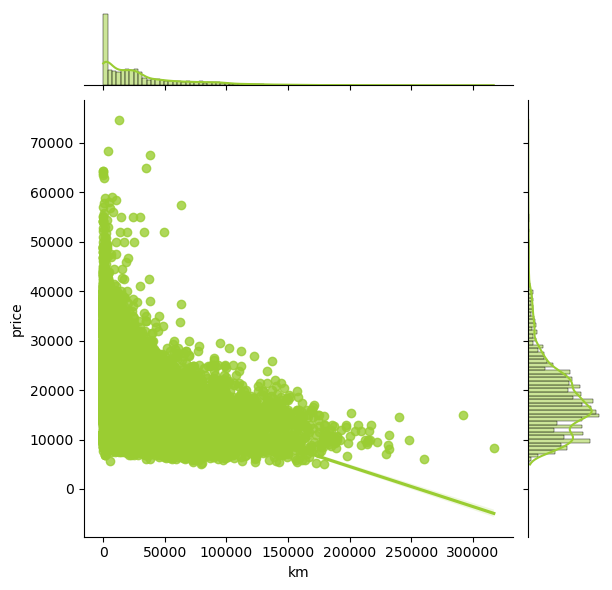

In [67]:
sns.jointplot(y=df["price"], x=df["km"],  kind='reg', color="yellowgreen" );

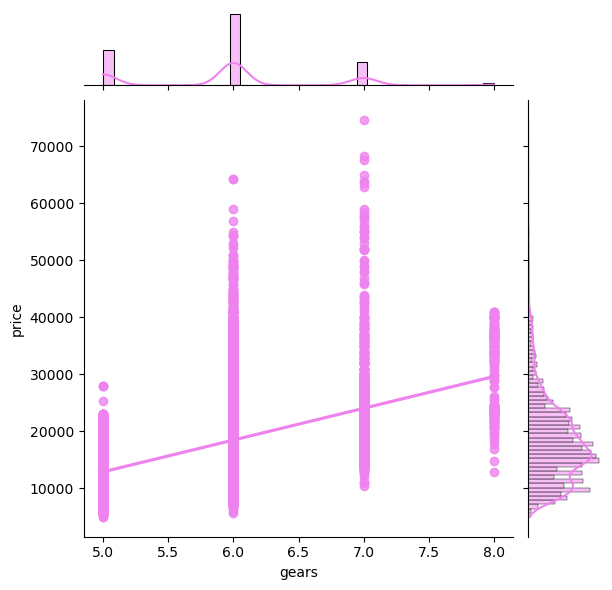

In [68]:
sns.jointplot(y=df["price"], x=df["gears"], kind='reg', color="violet");

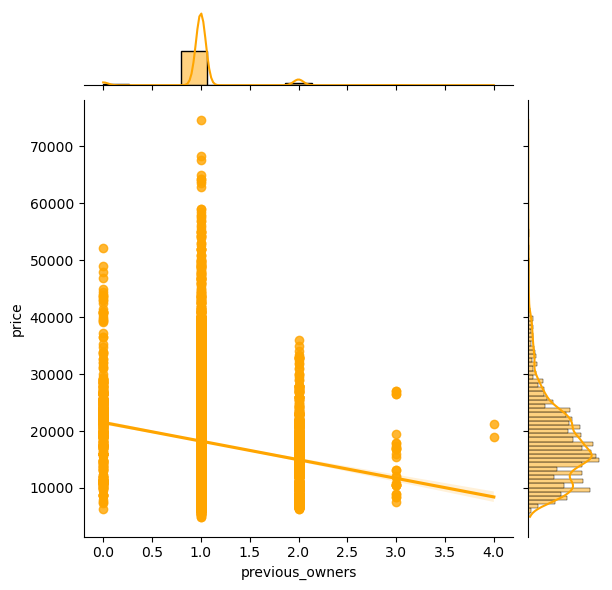

In [69]:
sns.jointplot(y=df["price"], x=df["previous_owners"],  kind='reg', color="orange");

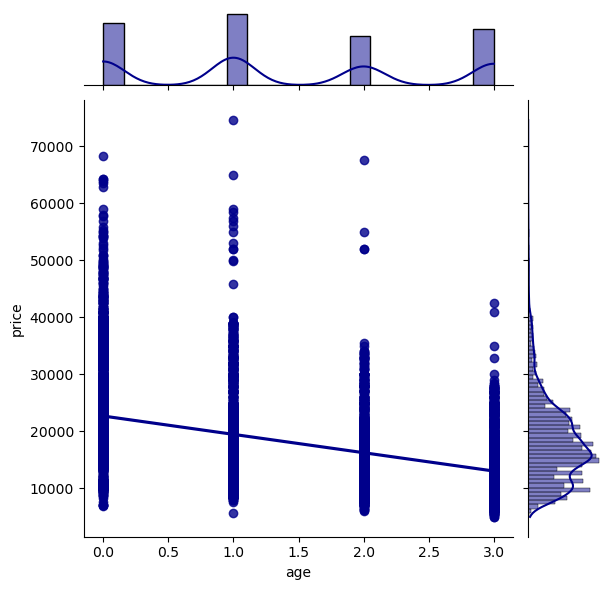

In [70]:
sns.jointplot(y=df["price"], x=df["age"],  kind='reg', color="darkblue");

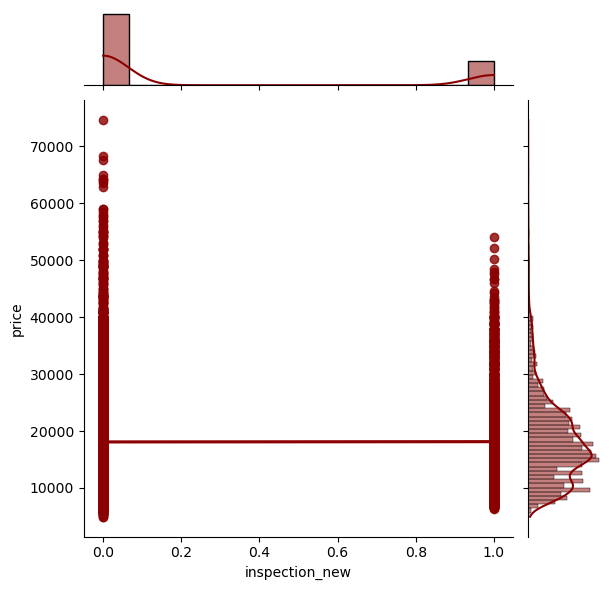

In [71]:
sns.jointplot(y=df["price"], x=df["inspection_new"],  kind='reg',  color="darkred");

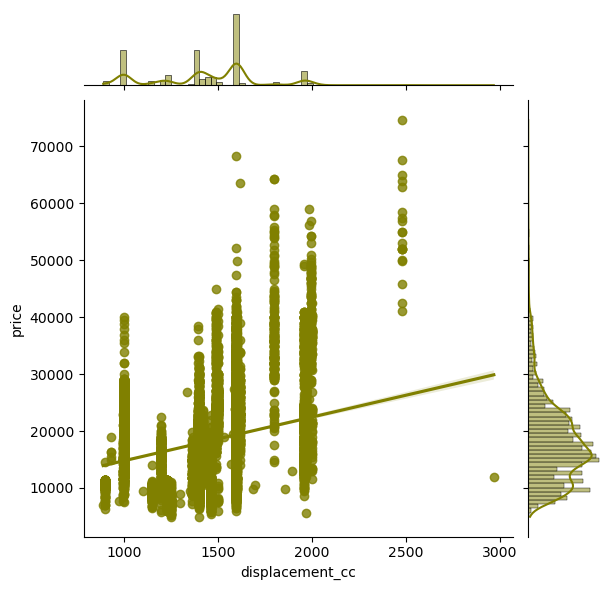

In [72]:
sns.jointplot(y=df["price"], x=df["displacement_cc"],  kind='reg', color="olive");

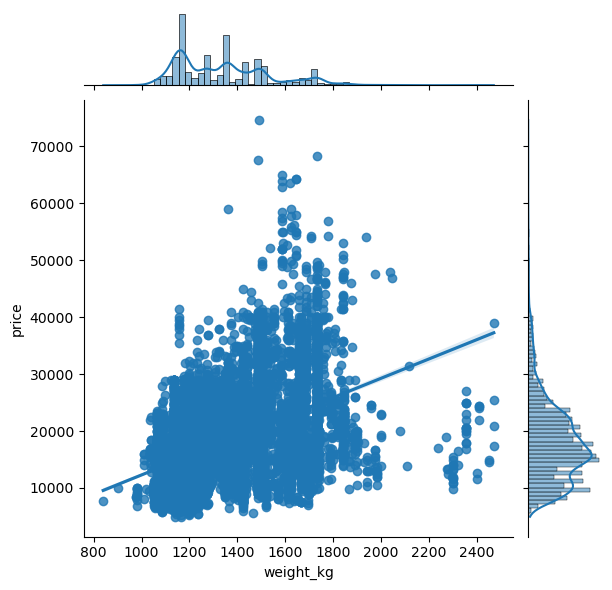

In [73]:
sns.jointplot(y=df["price"], x=df["weight_kg"],  kind='reg');

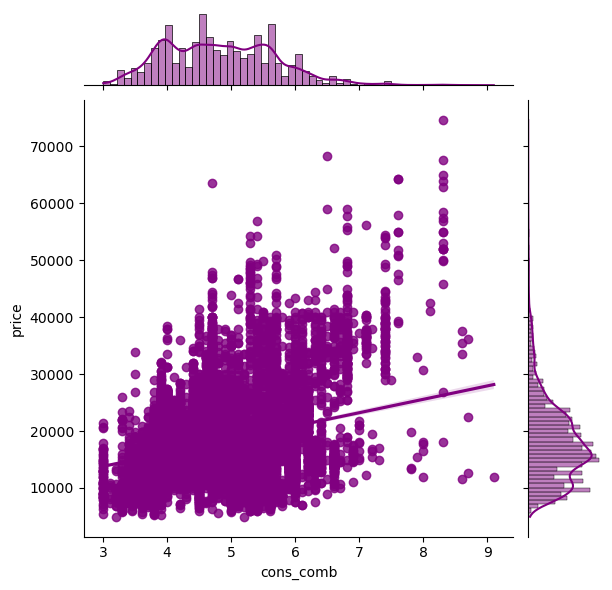

In [74]:
sns.jointplot(y=df["price"], x=df["cons_comb"],  kind='reg', color="purple");

In [75]:
numeric_df = df.select_dtypes(include=[np.number])
numeric_df

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb,cc_Air conditioning,cc_Air suspension,cc_Armrest,cc_Automatic climate control,cc_Auxiliary heating,cc_Cruise control,cc_Electric Starter,cc_Electric tailgate,cc_Electrical side mirrors,cc_Electrically adjustable seats,cc_Electrically heated windshield,cc_Heads-up display,cc_Heated steering wheel,cc_Hill Holder,cc_Keyless central door lock,cc_Leather seats,cc_Leather steering wheel,cc_Light sensor,cc_Lumbar support,cc_Massage seats,cc_Multi-function steering wheel,cc_Navigation system,cc_Panorama roof,cc_Park Distance Control,cc_Parking assist system camera,cc_Parking assist system self-steering,cc_Parking assist system sensors front,cc_Parking assist system sensors rear,cc_Power windows,cc_Rain sensor,cc_Seat heating,cc_Seat ventilation,cc_Split rear seats,cc_Start-stop system,cc_Sunroof,cc_Tinted windows,cc_Wind deflector,cc_Windshield,em_Bluetooth,em_CD player,...,paint_type_Uni/basic,upholstery_type_Part/Full Leather,gearing_type_Manual,gearing_type_Semi-automatic,drive_chain_front,drive_chain_rear,"price_bin_(12950.0, 16950.0]","price_bin_(16950.0, 21900.0]","price_bin_(21900.0, 74600.0]","price_bin_str_(16950.0, 21900.0]","price_bin_str_(21900.0, 74600.0]","price_bin_str_(4949.999, 12950.0]","km_bin_(3898.0, 21000.0]","km_bin_(21000.0, 47000.0]","km_bin_(47000.0, 317000.0]","km_bin_str_(21000.0, 47000.0]","km_bin_str_(3898.0, 21000.0]","km_bin_str_(47000.0, 317000.0]","gears_bin_(6.0, 8.0]","gears_bin_str_(6.0, 8.0]","age_bin_(1.0, 2.0]","age_bin_(2.0, 3.0]","age_bin_str_(1.0, 2.0]","age_bin_str_(2.0, 3.0]","previous_owners_bin_(1.0, 4.0]","previous_owners_bin_str_(1.0, 4.0]","hp_k_w_bin_(66.0, 85.0]","hp_k_w_bin_(85.0, 103.0]","hp_k_w_bin_(103.0, 294.0]","hp_k_w_bin_str_(39.999, 66.0]","hp_k_w_bin_str_(66.0, 85.0]","hp_k_w_bin_str_(85.0, 103.0]","displacement_cc_bin_(1229.0, 1461.0]","displacement_cc_bin_(1461.0, 1598.0]","displacement_cc_bin_(1598.0, 2967.0]","displacement_cc_bin_str_(1461.0, 1598.0]","displacement_cc_bin_str_(1598.0, 2967.0]","displacement_cc_bin_str_(889.999, 1229.0]","weight_kg_bin_(1165.0, 1320.0]","weight_kg_bin_(1320.0, 1487.0]","weight_kg_bin_(1487.0, 2471.0]","weight_kg_bin_str_(1320.0, 1487.0]","weight_kg_bin_str_(1487.0, 2471.0]","weight_kg_bin_str_(839.999, 1165.0]","cons_comb_bin_(4.1, 4.8]","cons_comb_bin_(4.8, 5.4]","cons_comb_bin_(5.4, 9.1]","cons_comb_bin_str_(4.1, 4.8]","cons_comb_bin_str_(4.8, 5.4]","cons_comb_bin_str_(5.4, 9.1]"
0,15770,56013.000000,7.0,3.0,2.0,66.0,1,1422.0,1220.0,3.8,1,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,14500,80000.000000,7.0,2.0,1.0,141.0,0,1798.0,1255.0,5.6,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
2,14640,83450.000000,7.0,3.0,1.0,85.0,0,1598.0,1135.0,3.8,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,1,1,1,0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,14500,73000.000000,6.0,3.0,1.0,66.0,0,1422.0,1195.0,3.8,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,1,1,0,0,0,0,0,0,1,1,1,0,1,1,0,0,0,0,1,1,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,16790,16200.000000,7.0,3.0,1.0,66.0,1,1422.0,1135.0,4.1,1,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,1,1,...,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Train - Test Split</b>
</h1>

In [76]:
X= df.drop(columns="price")
y= df.price

In [77]:
from sklearn.model_selection import train_test_split

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [79]:
print("X Train features shape: {}\ny Train features shape: {}\nX Test features shape : {}\nY Test features shape : {}".format
      (X_train.shape, y_train.shape, X_test.shape, y_test.shape))


X Train features shape: (11392, 176)
y Train features shape: (11392,)
X Test features shape : (2849, 176)
Y Test features shape : (2849,)


<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Simple Linear Regression Model</b>
</h1>

In [85]:
from sklearn.linear_model import LinearRegression

In [86]:
lm = LinearRegression()

In [87]:
lm.fit(X_train, y_train)

LinearRegression()

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Prediction on Test Data</b>
</h2>

In [88]:
y_pred = lm.predict(X_test)

In [89]:
my_dict = {"Actual":y_test, "pred":y_pred, "residual": y_test - y_pred }
compare = pd.DataFrame(my_dict)
compare.head(20)

,Actual,pred,residual
12606,28850,31297.416605,-2447.416605
11556,18880,17961.056920,918.943080
8431,12533,14272.735073,-1739.735073
12640,31990,28499.320936,3490.679064
8012,16790,15625.273494,1164.726506
11711,16990,19384.437955,-2394.437955
3327,27500,23621.811465,3878.188535
3661,30900,28683.384927,2216.615073
12607,28900,26199.121255,2700.878745
13897,9490,8143.283668,1346.716332


In [90]:
compare['residual'].sum()

-15575.339067197852

In [91]:
df

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb,cc_Air conditioning,cc_Air suspension,cc_Armrest,cc_Automatic climate control,cc_Auxiliary heating,cc_Cruise control,cc_Electric Starter,cc_Electric tailgate,cc_Electrical side mirrors,cc_Electrically adjustable seats,cc_Electrically heated windshield,cc_Heads-up display,cc_Heated steering wheel,cc_Hill Holder,cc_Keyless central door lock,cc_Leather seats,cc_Leather steering wheel,cc_Light sensor,cc_Lumbar support,cc_Massage seats,cc_Multi-function steering wheel,cc_Navigation system,cc_Panorama roof,cc_Park Distance Control,cc_Parking assist system camera,cc_Parking assist system self-steering,cc_Parking assist system sensors front,cc_Parking assist system sensors rear,cc_Power windows,cc_Rain sensor,cc_Seat heating,cc_Seat ventilation,cc_Split rear seats,cc_Start-stop system,cc_Sunroof,cc_Tinted windows,cc_Wind deflector,cc_Windshield,em_Bluetooth,em_CD player,...,paint_type_Uni/basic,upholstery_type_Part/Full Leather,gearing_type_Manual,gearing_type_Semi-automatic,drive_chain_front,drive_chain_rear,"price_bin_(12950.0, 16950.0]","price_bin_(16950.0, 21900.0]","price_bin_(21900.0, 74600.0]","price_bin_str_(16950.0, 21900.0]","price_bin_str_(21900.0, 74600.0]","price_bin_str_(4949.999, 12950.0]","km_bin_(3898.0, 21000.0]","km_bin_(21000.0, 47000.0]","km_bin_(47000.0, 317000.0]","km_bin_str_(21000.0, 47000.0]","km_bin_str_(3898.0, 21000.0]","km_bin_str_(47000.0, 317000.0]","gears_bin_(6.0, 8.0]","gears_bin_str_(6.0, 8.0]","age_bin_(1.0, 2.0]","age_bin_(2.0, 3.0]","age_bin_str_(1.0, 2.0]","age_bin_str_(2.0, 3.0]","previous_owners_bin_(1.0, 4.0]","previous_owners_bin_str_(1.0, 4.0]","hp_k_w_bin_(66.0, 85.0]","hp_k_w_bin_(85.0, 103.0]","hp_k_w_bin_(103.0, 294.0]","hp_k_w_bin_str_(39.999, 66.0]","hp_k_w_bin_str_(66.0, 85.0]","hp_k_w_bin_str_(85.0, 103.0]","displacement_cc_bin_(1229.0, 1461.0]","displacement_cc_bin_(1461.0, 1598.0]","displacement_cc_bin_(1598.0, 2967.0]","displacement_cc_bin_str_(1461.0, 1598.0]","displacement_cc_bin_str_(1598.0, 2967.0]","displacement_cc_bin_str_(889.999, 1229.0]","weight_kg_bin_(1165.0, 1320.0]","weight_kg_bin_(1320.0, 1487.0]","weight_kg_bin_(1487.0, 2471.0]","weight_kg_bin_str_(1320.0, 1487.0]","weight_kg_bin_str_(1487.0, 2471.0]","weight_kg_bin_str_(839.999, 1165.0]","cons_comb_bin_(4.1, 4.8]","cons_comb_bin_(4.8, 5.4]","cons_comb_bin_(5.4, 9.1]","cons_comb_bin_str_(4.1, 4.8]","cons_comb_bin_str_(4.8, 5.4]","cons_comb_bin_str_(5.4, 9.1]"
0,15770,56013.000000,7.0,3.0,2.0,66.0,1,1422.0,1220.0,3.8,1,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,0,0,1,1,1,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,14500,80000.000000,7.0,2.0,1.0,141.0,0,1798.0,1255.0,5.6,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1
2,14640,83450.000000,7.0,3.0,1.0,85.0,0,1598.0,1135.0,3.8,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,1,1,1,0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,1,1,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,14500,73000.000000,6.0,3.0,1.0,66.0,0,1422.0,1195.0,3.8,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,1,1,0,1,1,0,0,0,0,0,0,1,1,1,0,1,1,0,0,0,0,1,1,...,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,16790,16200.000000,7.0,3.0,1.0,66.0,1,1422.0,1135.0,4.1,1,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0,0,1,1,...,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

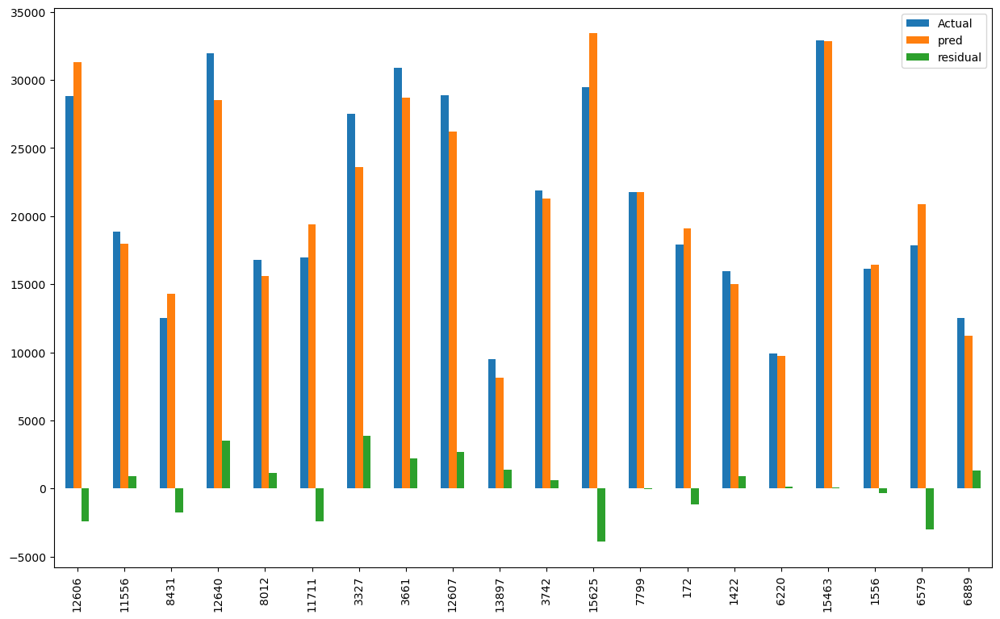

In [92]:
compare.head(20).plot(kind ="bar", figsize =(15,9))
plt.show();

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Polynomial Coefficients</b>
</h2>

In [94]:
lm.coef_

array([-2.51711312e-02,  7.31087402e+01, -2.05585230e+03,  5.37501478e+02,
        1.08805912e+02, -1.46153369e+02,  6.34350354e+00, -2.17304772e+00,
        1.78792887e+02,  3.67689025e+02, -1.68257712e+02,  6.27707572e+01,
        1.25395143e+02, -1.75382776e+02,  9.41947067e+01, -7.06229761e+02,
       -1.44870139e+02, -9.73648572e+01,  6.74691831e+01,  3.70399658e+02,
        2.24720870e+03,  2.09548682e+02,  7.98034289e+01,  1.52988425e+02,
       -1.19908355e+03,  7.22885989e+01,  2.41349377e+02, -2.15231759e+02,
        5.68756612e+02,  9.71509646e+01,  3.15793634e+02, -2.88467017e+02,
        4.87298695e+02,  7.79157873e+01,  7.70121975e+02,  9.25745038e+01,
       -3.32578314e+02,  6.67586471e+01, -2.88349598e+02,  2.54160655e+02,
        7.40545044e+02, -1.09538740e+02,  1.62174311e+01,  6.88974800e+02,
       -8.95429641e+01, -6.76588093e+02,  2.02106981e+02, -3.94593165e+02,
        1.20984517e+02,  5.56045168e+02,  6.12498034e+00,  4.71014336e+01,
       -8.06381803e+01,  

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Evaluation on the Test Set</b>
</h2>

In [95]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [96]:
y_pred = lm.predict(X_test)

In [97]:

def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    R2_score = r2_score(actual, pred)
    print("Model testing performance: ")
    print("---------------------------")
    print(f"R2_score \t: {R2_score}")
    print(f"MAE \t\t: {mae}")
    print(f"MSE \t\t: {mse}")
    print(f"RMSE \t\t: {rmse}")

In [98]:
eval_metric(y_test, y_pred) 

Model testing performance: 
---------------------------
R2_score 	: 0.914083446699098
MAE 		: 1406.502544422264
MSE 		: 4633428.164968771
RMSE 		: 2152.5399334202307


In [99]:
y_train_pred = lm.predict(X_train)  

In [100]:
eval_metric(y_train, y_train_pred) 

Model testing performance: 
---------------------------
R2_score 	: 0.9201631996443473
MAE 		: 1404.617124038815
MSE 		: 4418939.865780892
RMSE 		: 2102.1274618302505


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Scaling on the Data</b>
</h2>

In [101]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [102]:
scaler = RobustScaler()

In [103]:
scaler.fit(X_train)

RobustScaler()

In [104]:
X_train_scaled = scaler.transform(X_train)
X_train_scaled

array([[ 0.23099672, -1.        ,  0.5       , ...,  0.        ,
         0.        ,  0.        ],
       [-0.08264406,  1.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 1.2120512 ,  0.        ,  0.5       , ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [ 0.39270366, -1.        ,  1.        , ...,  1.        ,
         0.        ,  0.        ],
       [ 0.36190564, -1.        ,  0.5       , ...,  1.        ,
         0.        ,  0.        ],
       [-0.48287972, -1.        , -0.5       , ...,  1.        ,
         0.        ,  0.        ]])

In [105]:
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[-0.49420082,  2.        , -0.5       , ...,  0.        ,
         0.        ,  1.        ],
       [ 1.19218151,  0.        ,  0.5       , ...,  0.        ,
         1.        ,  0.        ],
       [-0.45637072,  0.        , -0.5       , ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [ 1.9914052 , -1.        ,  1.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.26107851, -1.        ,  0.5       , ...,  0.        ,
         0.        ,  0.        ],
       [-0.02541472,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [106]:
#pd.DataFrame(X_train_scaled).agg(["mean", "std"]).round()

In [107]:
#pd.DataFrame(X_test_scaled).agg(["mean", "std"]).round().T

In [108]:
#normscaler = MinMaxScaler()

In [109]:
#normscaler.fit(X_train)

In [110]:
#X_train_normscaled = normscaler.transform(X_train)
#X_train_normscaled

In [111]:
#X_test_normscaled = normscaler.transform(X_test)
#X_test_normscaled

In [112]:
#pd.DataFrame(X_train_normscaled).agg(["mean", "std"]).round()

In [113]:
#pd.DataFrame(X_test_normscaled).agg(["mean", "std"]).round()

<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Linear Regression Model</b>
</h1>

In [114]:
from sklearn.linear_model import LinearRegression

In [115]:
ls = LinearRegression()

In [116]:
ls.fit(X_train_scaled, y_train)

LinearRegression()

In [117]:
y_pred = ls.predict(X_test_scaled)
y_train_pred = ls.predict(X_train_scaled)

In [252]:
def train_val(y_train, y_train_pred, y_test, y_pred, i): 
    scores = {str(i) + "_train": {"R2": r2_score(y_train, y_train_pred),
                                   "mae": mean_absolute_error(y_train, y_train_pred),
                                   "mse": mean_squared_error(y_train, y_train_pred),
                                   "rmse": np.sqrt(mean_squared_error(y_train, y_train_pred))},
              str(i) + "_test": {"R2": r2_score(y_test, y_pred),
                                  "mae": mean_absolute_error(y_test, y_pred),
                                  "mse": mean_squared_error(y_test, y_pred),
                                  "rmse": np.sqrt(mean_squared_error(y_test, y_pred))}}
    return pd.DataFrame(scores)


In [121]:
def convert_and_round_df(df):
    for column in df.columns:
        try:
            df[column] = df[column].apply(lambda x: round(float(x), 2))
        except:
            continue
    return df

df = convert_and_round_df(plm)
df


,linear_train,linear_test
R2,0.92,0.91
mae,1404.63,1406.51
mse,4418940.12,4633442.31
rmse,2102.13,2152.54


In [122]:
plm = convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "linear"))
plm 

,linear_train,linear_test
R2,0.92,0.91
mae,1404.63,1406.51
mse,4418940.12,4633442.31
rmse,2102.13,2152.54


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Cross Validate</b>
</h2>

In [125]:
from sklearn.model_selection import cross_validate, cross_val_score

In [126]:
import sklearn.metrics
for i in dir(sklearn.metrics):
    print(i)

ConfusionMatrixDisplay
DetCurveDisplay
DistanceMetric
PrecisionRecallDisplay
PredictionErrorDisplay
RocCurveDisplay
__all__
__builtins__
__cached__
__doc__
__file__
__loader__
__name__
__package__
__path__
__spec__
_base
_classification
_dist_metrics
_pairwise_distances_reduction
_pairwise_fast
_plot
_ranking
_regression
_scorer
accuracy_score
adjusted_mutual_info_score
adjusted_rand_score
auc
average_precision_score
balanced_accuracy_score
brier_score_loss
calinski_harabasz_score
check_scoring
class_likelihood_ratios
classification_report
cluster
cohen_kappa_score
completeness_score
confusion_matrix
consensus_score
coverage_error
d2_absolute_error_score
d2_pinball_score
d2_tweedie_score
davies_bouldin_score
dcg_score
det_curve
euclidean_distances
explained_variance_score
f1_score
fbeta_score
fowlkes_mallows_score
get_scorer
get_scorer_names
hamming_loss
hinge_loss
homogeneity_completeness_v_measure
homogeneity_score
jaccard_score
label_ranking_average_precision_score
label_ranking_los

In [127]:
model = LinearRegression()
scores = cross_validate(model, X_train_scaled, y_train, scoring =['r2',
                                                                  'neg_mean_absolute_error',
                                                                  'neg_mean_squared_error',
                                                                  'neg_root_mean_squared_error',], cv = 5)

In [128]:
pd.DataFrame(scores, index = range(1,6))

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_root_mean_squared_error
1,0.053105,0.003989,-7.109520e+15,-1.346977e+10,-4.134897e+23,-6.430317e+11
2,0.053522,0.002991,9.224217e-01,-1.411588e+03,-4.052369e+06,-2.013050e+03
3,0.045611,0.002990,9.192159e-01,-1.420262e+03,-4.318360e+06,-2.078066e+03
4,0.049506,0.001995,9.138732e-01,-1.421043e+03,-4.779331e+06,-2.186168e+03
5,0.045080,0.003988,9.135109e-01,-1.430651e+03,-4.953943e+06,-2.225746e+03


In [129]:
cv_df = pd.DataFrame(scores, index=range(1, 6)).add_prefix("cv_")
cv_df

,cv_fit_time,cv_score_time,cv_test_r2,cv_test_neg_mean_absolute_error,cv_test_neg_mean_squared_error,cv_test_neg_root_mean_squared_error
1,0.053105,0.003989,-7.109520e+15,-1.346977e+10,-4.134897e+23,-6.430317e+11
2,0.053522,0.002991,9.224217e-01,-1.411588e+03,-4.052369e+06,-2.013050e+03
3,0.045611,0.002990,9.192159e-01,-1.420262e+03,-4.318360e+06,-2.078066e+03
4,0.049506,0.001995,9.138732e-01,-1.421043e+03,-4.779331e+06,-2.186168e+03
5,0.045080,0.003988,9.135109e-01,-1.430651e+03,-4.953943e+06,-2.225746e+03


In [130]:
cv_df= cv_df.iloc[:, 2:].mean()
cv_df


cv_test_r2                            -1.421904e+15
cv_test_neg_mean_absolute_error       -2.693956e+09
cv_test_neg_mean_squared_error        -8.269794e+22
cv_test_neg_root_mean_squared_error   -1.286063e+11
dtype: float64

In [131]:
def convert_and_round_df(df):
    for column in df.columns:
        try:
            df[column] = df[column].apply(lambda x: round(float(x), 2))
        except:
            continue
    return df



In [132]:
a=train_val(y_train, y_train_pred, y_test, y_pred, "linear")
a= convert_and_round_df(a)
a

,linear_train,linear_test
R2,0.92,0.91
mae,1404.63,1406.51
mse,4418940.12,4633442.31
rmse,2102.13,2152.54


In [133]:
lm.coef_

array([-2.51711312e-02,  7.31087402e+01, -2.05585230e+03,  5.37501478e+02,
        1.08805912e+02, -1.46153369e+02,  6.34350354e+00, -2.17304772e+00,
        1.78792887e+02,  3.67689025e+02, -1.68257712e+02,  6.27707572e+01,
        1.25395143e+02, -1.75382776e+02,  9.41947067e+01, -7.06229761e+02,
       -1.44870139e+02, -9.73648572e+01,  6.74691831e+01,  3.70399658e+02,
        2.24720870e+03,  2.09548682e+02,  7.98034289e+01,  1.52988425e+02,
       -1.19908355e+03,  7.22885989e+01,  2.41349377e+02, -2.15231759e+02,
        5.68756612e+02,  9.71509646e+01,  3.15793634e+02, -2.88467017e+02,
        4.87298695e+02,  7.79157873e+01,  7.70121975e+02,  9.25745038e+01,
       -3.32578314e+02,  6.67586471e+01, -2.88349598e+02,  2.54160655e+02,
        7.40545044e+02, -1.09538740e+02,  1.62174311e+01,  6.88974800e+02,
       -8.95429641e+01, -6.76588093e+02,  2.02106981e+02, -3.94593165e+02,
        1.20984517e+02,  5.56045168e+02,  6.12498034e+00,  4.71014336e+01,
       -8.06381803e+01,  

In [134]:
lm_df = pd.DataFrame(lm.coef_, columns = ["lm_coef"])
lm_df

,lm_coef
0,-0.025171
1,73.108740
2,-2055.852304
3,537.501478
4,108.805912
...,...
171,-291.368355
172,-305.724984
173,-96.491611
174,-291.368355


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Choosing best alpha value with Cross Validation (CV) (Rigde)</b>
</h2>

In [135]:
from sklearn.linear_model import Ridge

In [136]:
from sklearn.linear_model import RidgeCV

In [137]:
alpha_space = np.linspace(0.01, 0.02, 100)
alpha_space


array([0.01      , 0.01010101, 0.01020202, 0.01030303, 0.01040404,
       0.01050505, 0.01060606, 0.01070707, 0.01080808, 0.01090909,
       0.0110101 , 0.01111111, 0.01121212, 0.01131313, 0.01141414,
       0.01151515, 0.01161616, 0.01171717, 0.01181818, 0.01191919,
       0.0120202 , 0.01212121, 0.01222222, 0.01232323, 0.01242424,
       0.01252525, 0.01262626, 0.01272727, 0.01282828, 0.01292929,
       0.0130303 , 0.01313131, 0.01323232, 0.01333333, 0.01343434,
       0.01353535, 0.01363636, 0.01373737, 0.01383838, 0.01393939,
       0.0140404 , 0.01414141, 0.01424242, 0.01434343, 0.01444444,
       0.01454545, 0.01464646, 0.01474747, 0.01484848, 0.01494949,
       0.01505051, 0.01515152, 0.01525253, 0.01535354, 0.01545455,
       0.01555556, 0.01565657, 0.01575758, 0.01585859, 0.0159596 ,
       0.01606061, 0.01616162, 0.01626263, 0.01636364, 0.01646465,
       0.01656566, 0.01666667, 0.01676768, 0.01686869, 0.0169697 ,
       0.01707071, 0.01717172, 0.01727273, 0.01737374, 0.01747

In [138]:
ridge_cv_model = RidgeCV(alphas = alpha_space, cv= 5, scoring = "neg_root_mean_squared_error")

In [139]:
ridge_cv_model.fit(X_train_scaled, y_train)

RidgeCV(alphas=array([0.01      , 0.01010101, 0.01020202, 0.01030303, 0.01040404,
       0.01050505, 0.01060606, 0.01070707, 0.01080808, 0.01090909,
       0.0110101 , 0.01111111, 0.01121212, 0.01131313, 0.01141414,
       0.01151515, 0.01161616, 0.01171717, 0.01181818, 0.01191919,
       0.0120202 , 0.01212121, 0.01222222, 0.01232323, 0.01242424,
       0.01252525, 0.01262626, 0.01272727, 0.01282828, 0.01292929,
       0.0130...
       0.01707071, 0.01717172, 0.01727273, 0.01737374, 0.01747475,
       0.01757576, 0.01767677, 0.01777778, 0.01787879, 0.0179798 ,
       0.01808081, 0.01818182, 0.01828283, 0.01838384, 0.01848485,
       0.01858586, 0.01868687, 0.01878788, 0.01888889, 0.0189899 ,
       0.01909091, 0.01919192, 0.01929293, 0.01939394, 0.01949495,
       0.01959596, 0.01969697, 0.01979798, 0.01989899, 0.02      ]),
        cv=5, scoring='neg_root_mean_squared_error')

In [140]:
ridge_cv_model.alpha_

0.02

In [141]:
ridge_cv_model.best_score_

-2150.172022206122

In [142]:
y_pred = ridge_cv_model.predict(X_test_scaled)
y_train_pred = ridge_cv_model.predict(X_train_scaled)

In [143]:
rcs =  convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "rigde_cv"))
rcs

,rigde_cv_train,rigde_cv_test
R2,0.92,0.91
mae,1404.62,1406.46
mse,4418941.04,4632971.06
rmse,2102.13,2152.43


In [144]:
convert_and_round_df(pd.concat([ rcs], axis = 1))

,rigde_cv_train,rigde_cv_test
R2,0.92,0.91
mae,1404.62,1406.46
mse,4418941.04,4632971.06
rmse,2102.13,2152.43


In [145]:
ridge_cv_model.coef_

array([-1.08938731e+03,  7.30341202e+01, -4.11049810e+03,  5.37814782e+02,
        4.02575222e+03, -1.46134900e+02,  2.33988880e+03, -6.99480608e+02,
        2.32683981e+02,  3.67688043e+02, -1.67821525e+02,  6.28339353e+01,
        1.25298512e+02, -1.75389332e+02,  9.42039924e+01, -6.92386710e+02,
       -1.44868498e+02, -9.73857913e+01,  6.74818316e+01,  3.70457196e+02,
        2.24708124e+03,  2.09384386e+02,  7.97422636e+01,  1.52965796e+02,
       -1.19850707e+03,  7.22967082e+01,  2.41370480e+02, -2.15294253e+02,
        5.68653948e+02,  9.71342012e+01,  3.15778154e+02, -2.88384122e+02,
        4.87303388e+02,  7.78685068e+01,  7.70001535e+02,  9.25205120e+01,
       -3.32510625e+02,  6.69494743e+01, -2.88316209e+02,  2.54265318e+02,
        7.40512419e+02, -1.09475190e+02,  1.61983571e+01,  6.88865353e+02,
       -8.95959869e+01, -6.76315687e+02,  2.01570704e+02, -3.94653316e+02,
        1.20947557e+02,  5.56072822e+02,  6.15243083e+00,  4.71133940e+01,
       -8.05941887e+01,  

In [146]:
rcm_df = pd.DataFrame(ridge_cv_model.coef_, columns = ["ridge_cv_model.coef_0.02"])

In [147]:
convert_and_round_df(pd.concat([lm_df, rcm_df], axis = 1))

,lm_coef,ridge_cv_model.coef_0.02
0,-0.03,-1089.39
1,73.11,73.03
2,-2055.85,-4110.50
3,537.50,537.81
4,108.81,4025.75
...,...,...
171,-291.37,-291.51
172,-305.72,-305.87
173,-96.49,-96.63
174,-291.37,-291.51


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Lasso</b>
</h2>

In [148]:
from sklearn.linear_model import Lasso, LassoCV

In [149]:
lasso_model = Lasso(alpha=0.01, random_state = 42)
lasso_model.fit(X_train_scaled, y_train)

Lasso(alpha=0.01, random_state=42)

In [150]:
y_pred = lasso_model.predict(X_test_scaled)
y_train_pred = lasso_model.predict(X_train_scaled)

In [151]:
lss = convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "lasso"))
lss

,lasso_train,lasso_test
R2,0.92,0.91
mae,1404.58,1406.39
mse,4418944.02,4632775.35
rmse,2102.13,2152.39


In [152]:
convert_and_round_df(pd.concat([ rcs, lss], axis = 1))

,rigde_cv_train,rigde_cv_test,lasso_train,lasso_test
R2,0.92,0.91,0.92,0.91
mae,1404.62,1406.46,1404.58,1406.39
mse,4418941.04,4632971.06,4418944.02,4632775.35
rmse,2102.13,2152.43,2102.13,2152.39


In [153]:
model = Lasso(alpha=1.0, random_state = 42)
scores = cross_validate(model, X_train_scaled, y_train, scoring =['r2',
                                                                  'neg_mean_absolute_error',
                                                                  'neg_mean_squared_error',
                                                                  'neg_root_mean_squared_error',], cv = 5)

In [154]:
pd.DataFrame(scores, index = range(1,6))

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_root_mean_squared_error
1,0.297527,0.005495,0.914840,-1464.961238,-4.952902e+06,-2225.511637
2,0.295110,0.004506,0.922729,-1405.138912,-4.036313e+06,-2009.057665
3,0.289798,0.003988,0.918956,-1420.322770,-4.332236e+06,-2081.402410
4,0.263241,0.003987,0.913551,-1416.466720,-4.797227e+06,-2190.257258
5,0.280020,0.002995,0.913060,-1429.013225,-4.979748e+06,-2231.534832


In [155]:
scores = convert_and_round_df(pd.DataFrame(scores, index = range(1,6)))
scores.iloc[:,2:].mean()

test_r2                                   0.914
test_neg_mean_absolute_error          -1427.180
test_neg_mean_squared_error        -4619685.062
test_neg_root_mean_squared_error      -2147.552
dtype: float64

<Axes: >

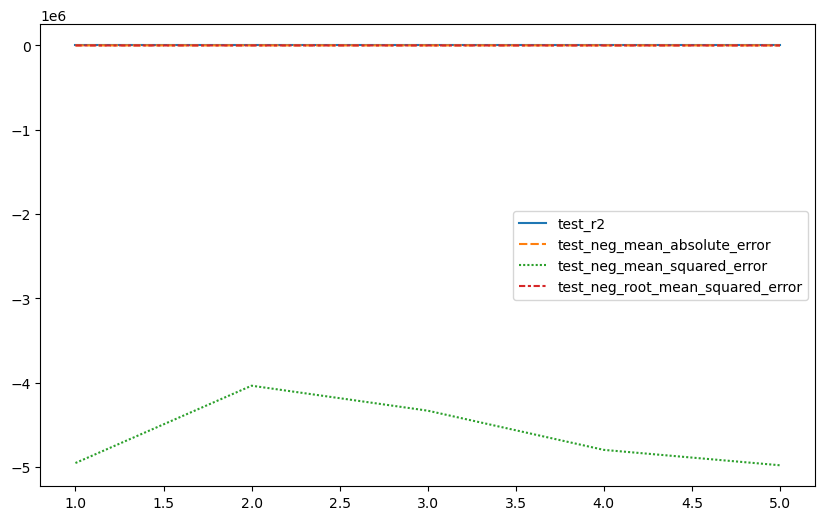

In [156]:
sns.lineplot(data=scores.iloc[:,2:])

In [157]:
lasso_model.coef_

array([-1.08952492e+03,  7.30947309e+01, -4.11023314e+03,  5.37072663e+02,
        4.02589793e+03, -1.46006993e+02,  2.33900278e+03, -6.98873268e+02,
        2.32022422e+02,  3.67501721e+02, -1.67117872e+02,  6.28917340e+01,
        1.25289191e+02, -1.75114556e+02,  9.41423571e+01, -5.90978095e+02,
       -1.44657178e+02, -9.72635501e+01,  6.74777266e+01,  3.70331586e+02,
        2.24718946e+03,  2.09270249e+02,  7.97757958e+01,  1.52785798e+02,
       -1.19636727e+03,  7.23052409e+01,  2.41091094e+02, -2.15246969e+02,
        5.68339092e+02,  9.70635443e+01,  3.15655245e+02, -2.87672880e+02,
        4.87259561e+02,  7.77627544e+01,  7.69865882e+02,  9.24212289e+01,
       -3.32242087e+02,  6.66003785e+01, -2.88061009e+02,  2.54310858e+02,
        7.40522008e+02, -1.09352730e+02,  1.61897699e+01,  6.88045645e+02,
       -8.96414609e+01, -6.72826805e+02,  1.90437441e+02, -3.94516872e+02,
        1.20851302e+02,  5.56094859e+02,  5.91803516e+00,  4.69448583e+01,
       -8.03694603e+01,  

In [158]:
lsm_df = pd.DataFrame(lasso_model.coef_, columns = ["losso_coef_alpha_1"])

In [159]:
convert_and_round_df(pd.concat([lm_df, rcm_df, lsm_df], axis=1))

,lm_coef,ridge_cv_model.coef_0.02,losso_coef_alpha_1
0,-0.03,-1089.39,-1089.52
1,73.11,73.03,73.09
2,-2055.85,-4110.50,-4110.23
3,537.50,537.81,537.07
4,108.81,4025.75,4025.90
...,...,...,...
171,-291.37,-291.51,-365.28
172,-305.72,-305.87,-476.70
173,-96.49,-96.63,-192.56
174,-291.37,-291.51,-216.49


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Choosing best alpha value with Cross Validation (CV) (Lasso)</b>
</h2>

In [160]:
alpha_space = np.linspace(0.01, 0.1, 100)
alpha_space

array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03272727, 0.03363636, 0.03454545, 0.03545455, 0.03636364,
       0.03727273, 0.03818182, 0.03909091, 0.04      , 0.04090909,
       0.04181818, 0.04272727, 0.04363636, 0.04454545, 0.04545455,
       0.04636364, 0.04727273, 0.04818182, 0.04909091, 0.05      ,
       0.05090909, 0.05181818, 0.05272727, 0.05363636, 0.05454545,
       0.05545455, 0.05636364, 0.05727273, 0.05818182, 0.05909091,
       0.06      , 0.06090909, 0.06181818, 0.06272727, 0.06363636,
       0.06454545, 0.06545455, 0.06636364, 0.06727273, 0.06818182,
       0.06909091, 0.07      , 0.07090909, 0.07181818, 0.07272727,
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727

In [161]:
lasso_cv_model = LassoCV(alphas=alpha_space, cv = 5,  max_iter=10000, random_state = 42)

In [162]:
lasso_cv_model.fit(X_train_scaled, y_train)

LassoCV(alphas=array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03272727, 0.03363636, 0.03454545, 0.03545455, 0.03636364,
       0.03727273, 0.038...
       0.06909091, 0.07      , 0.07090909, 0.07181818, 0.07272727,
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727273,
       0.07818182, 0.07909091, 0.08      , 0.08090909, 0.08181818,
       0.08272727, 0.08363636, 0.08454545, 0.08545455, 0.08636364,
       0.08727273, 0.08818182, 0.08909091, 0.09      , 0.09090909,
       0.09181818, 0.09272727, 0.09363636, 0.09454545, 0.09545455,
       0.09636364, 0.09727273, 0.09818182, 0.09909091, 0.1       ]),
        cv=5, max_iter=10000, random_state=42)

In [163]:
lasso_cv_model.alpha_

0.1

In [164]:
best_alpha = lasso_cv_model.alpha_

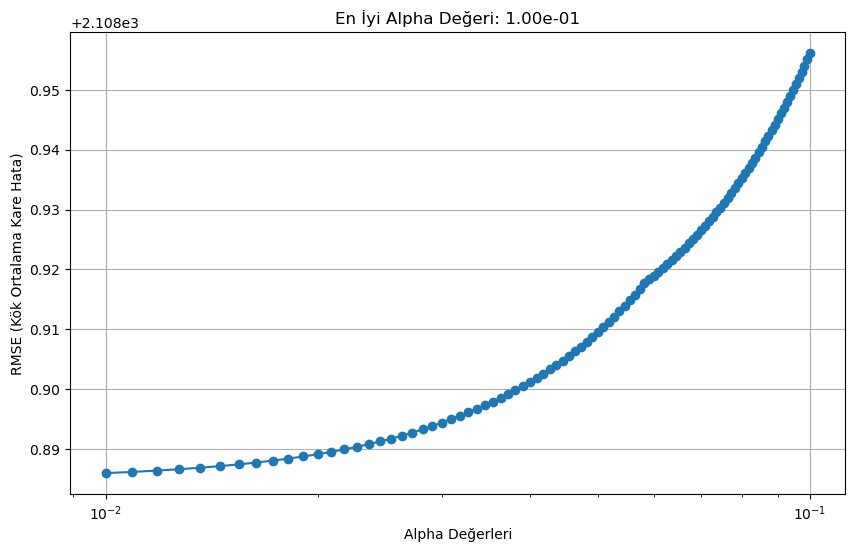

In [165]:
rmse_values = []
for alpha in alpha_space:
    lasso_model = Lasso(alpha=alpha, max_iter=100000, random_state=42)
    lasso_model.fit(X, y)
    y_pred = lasso_model.predict(X)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    rmse_values.append(rmse)

# Alpha değerlerini ve RMSE değerlerini görselleştirin
plt.figure(figsize=(10, 6))
plt.plot(alpha_space, rmse_values, marker='o')
plt.xscale('log')  # X eksenini logaritmik ölçekte ayarlayın
plt.xlabel('Alpha Değerleri')
plt.ylabel('RMSE (Kök Ortalama Kare Hata)')
plt.title(f'En İyi Alpha Değeri: {best_alpha:.2e}')
plt.grid()
plt.show()

In [166]:
y_pred = lasso_cv_model.predict(X_test_scaled)
y_train_pred = lasso_cv_model.predict(X_train_scaled)

In [167]:
lcs = convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "lasso_cv"))
lcs

,lasso_cv_train,lasso_cv_test
R2,0.92,0.91
mae,1404.32,1405.35
mse,4419264.89,4627062.62
rmse,2102.20,2151.06


In [168]:
pd.concat([plm, rcs, lss, lcs], axis=1)

,linear_train,linear_test,rigde_cv_train,rigde_cv_test,lasso_train,lasso_test,lasso_cv_train,lasso_cv_test
R2,0.92,0.91,0.92,0.91,0.92,0.91,0.92,0.91
mae,1404.63,1406.51,1404.62,1406.46,1404.58,1406.39,1404.32,1405.35
mse,4418940.12,4633442.31,4418941.04,4632971.06,4418944.02,4632775.35,4419264.89,4627062.62
rmse,2102.13,2152.54,2102.13,2152.43,2102.13,2152.39,2102.20,2151.06


In [169]:
lasso_cv_model.coef_

array([-1.09012996e+03,  7.37951195e+01, -4.09694943e+03,  5.33193887e+02,
        4.02597495e+03, -1.44837637e+02,  2.32252410e+03, -6.90802614e+02,
        2.28805270e+02,  3.65933407e+02, -1.57981772e+02,  6.38504843e+01,
        1.24391874e+02, -1.72458098e+02,  9.37910010e+01, -0.00000000e+00,
       -1.42543770e+02, -9.61746784e+01,  6.75197073e+01,  3.69704432e+02,
        2.24732138e+03,  2.07179372e+02,  7.93403395e+01,  1.51287878e+02,
       -1.16867584e+03,  7.25116723e+01,  2.38763180e+02, -2.15418691e+02,
        5.64050336e+02,  9.62970549e+01,  3.14368720e+02, -2.80818357e+02,
        4.86829844e+02,  7.65287434e+01,  7.67067052e+02,  9.10681869e+01,
       -3.29041751e+02,  6.51606726e+01, -2.85421606e+02,  2.55417932e+02,
        7.40154924e+02, -1.07813299e+02,  1.56830277e+01,  6.79505919e+02,
       -9.02752885e+01, -6.35621662e+02,  8.51098905e+01, -3.93943192e+02,
        1.19591595e+02,  5.56445966e+02,  4.20693077e+00,  4.56570113e+01,
       -7.80400886e+01,  

In [170]:
lcm_df = pd.DataFrame(lasso_cv_model.coef_, columns = ["lasso_cv_coef_0.01"])

In [171]:
pd.concat([lm_df,  rcm_df, lsm_df, lcm_df], axis = 1)

,lm_coef,ridge_cv_model.coef_0.02,losso_coef_alpha_1,lasso_cv_coef_0.01
0,-0.025171,-1089.387308,-1089.524916,-1090.129956
1,73.108740,73.034120,73.094731,73.795119
2,-2055.852304,-4110.498097,-4110.233143,-4096.949434
3,537.501478,537.814782,537.072663,533.193887
4,108.805912,4025.752222,4025.897927,4025.974952
...,...,...,...,...
171,-291.368355,-291.509050,-365.283420,-355.963286
172,-305.724984,-305.870693,-476.700084,-466.890131
173,-96.491611,-96.629281,-192.563181,-188.895420
174,-291.368355,-291.509050,-216.488095,-218.185264


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Choosing best alpha value with Cross Validation (CV) (Elastic)</b>
</h2>

In [172]:
from sklearn.linear_model import ElasticNet, ElasticNetCV

In [173]:
elastic_cv_model = ElasticNetCV(alphas = alpha_space,
                                l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 1],
                                cv = 5, max_iter = 100000, random_state = 42)

In [174]:
elastic_cv_model.fit(X_train_scaled, y_train)

ElasticNetCV(alphas=array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03272727, 0.03363636, 0.03454545, 0.03545455, 0.03636364,
       0.03727273,...
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727273,
       0.07818182, 0.07909091, 0.08      , 0.08090909, 0.08181818,
       0.08272727, 0.08363636, 0.08454545, 0.08545455, 0.08636364,
       0.08727273, 0.08818182, 0.08909091, 0.09      , 0.09090909,
       0.09181818, 0.09272727, 0.09363636, 0.09454545, 0.09545455,
       0.09636364, 0.09727273, 0.09818182, 0.09909091, 0.1       ]),
             cv=5, l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 1], max_iter=100000,
             random_state=42)

In [175]:
elastic_cv_model.alpha_

0.1

In [176]:
elastic_cv_model.l1_ratio_

1.0

In [177]:
y_pred = elastic_cv_model.predict(X_test_scaled)
y_train_pred = elastic_cv_model.predict(X_train_scaled)

In [178]:
ecs = convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "elastic_cv"))
ecs

,elastic_cv_train,elastic_cv_test
R2,0.92,0.91
mae,1404.32,1405.35
mse,4419264.89,4627062.62
rmse,2102.20,2151.06


In [179]:
pd.concat([plm, rcs, lss, lcs, ecs], axis = 1)

,linear_train,linear_test,rigde_cv_train,rigde_cv_test,lasso_train,lasso_test,lasso_cv_train,lasso_cv_test,elastic_cv_train,elastic_cv_test
R2,0.92,0.91,0.92,0.91,0.92,0.91,0.92,0.91,0.92,0.91
mae,1404.63,1406.51,1404.62,1406.46,1404.58,1406.39,1404.32,1405.35,1404.32,1405.35
mse,4418940.12,4633442.31,4418941.04,4632971.06,4418944.02,4632775.35,4419264.89,4627062.62,4419264.89,4627062.62
rmse,2102.13,2152.54,2102.13,2152.43,2102.13,2152.39,2102.20,2151.06,2102.20,2151.06


<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>GridSearchCV</b>
</h2>

In [180]:
from sklearn.model_selection import GridSearchCV

In [181]:
elastic_model = ElasticNet(max_iter = 10000, random_state = 42)

In [182]:
param_grid = {"alpha":[0.01, 0.012, 0.2, 0.5, 0.6, 0.7, 1],
             "l1_ratio":[0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1]}

In [183]:
grid_model = GridSearchCV(estimator= elastic_model,
                          param_grid = param_grid,
                          scoring = "neg_root_mean_squared_error",
                          cv = 10, verbose = 2) # verbose alttaki raporu verdi

In [184]:
grid_model.fit(X_train_scaled, y_train)

Fitting 10 folds for each of 49 candidates, totalling 490 fits
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.5s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.5s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.5s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.4s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.4s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.4s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.4s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.5s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.4s
[CV] END ...........................alpha=0.01, l1_ratio=0.1; total time=   0.4s
[CV] END ...........................alpha=0.01, l1_ratio=0.5; total time=   0.4s
[CV] END ...........................alpha=0.01

[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.3s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.3s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.5s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.5s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.3s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.3s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.3s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.3s
[CV] END ..........................alpha=0.012, l1_ratio=0.9; total time=   1.3s
[CV] END .........................alpha=0.012, l1_ratio=0.95; total time=   2.4s
[CV] END .........................alpha=0.012, l1_ratio=0.95; total time=   2.4s
[CV] END .........................alpha=0.012, l1_ratio=0.95; total time=   2.3s
[CV] END ...................

[CV] END ..............................alpha=0.2, l1_ratio=1; total time=   0.4s
[CV] END ..............................alpha=0.2, l1_ratio=1; total time=   0.4s
[CV] END ..............................alpha=0.2, l1_ratio=1; total time=   0.4s
[CV] END ..............................alpha=0.2, l1_ratio=1; total time=   0.4s
[CV] END ..............................alpha=0.2, l1_ratio=1; total time=   0.4s
[CV] END ..............................alpha=0.2, l1_ratio=1; total time=   0.4s
[CV] END ..............................alpha=0.2, l1_ratio=1; total time=   0.4s
[CV] END ............................alpha=0.5, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=0.5, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=0.5, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=0.5, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=0.5, l1_ratio=0.1; total time=   0.0s
[CV] END ...................

[CV] END ............................alpha=0.6, l1_ratio=0.7; total time=   0.0s
[CV] END ............................alpha=0.6, l1_ratio=0.7; total time=   0.0s
[CV] END ............................alpha=0.6, l1_ratio=0.7; total time=   0.0s
[CV] END ............................alpha=0.6, l1_ratio=0.7; total time=   0.0s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.1s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.1s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.1s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.1s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.1s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.1s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.0s
[CV] END ............................alpha=0.6, l1_ratio=0.9; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.7, l1_ratio=0.99; total time=   0.2s
[CV] END ...........................alpha=0.7, l1_ratio=0.99; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ..............................alpha=0.7, l1_ratio=1; total time=   0.2s
[CV] END ...................

GridSearchCV(cv=10, estimator=ElasticNet(max_iter=10000, random_state=42),
             param_grid={'alpha': [0.01, 0.012, 0.2, 0.5, 0.6, 0.7, 1],
                         'l1_ratio': [0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1]},
             scoring='neg_root_mean_squared_error', verbose=2)

In [185]:
grid_model.best_params_

{'alpha': 0.012, 'l1_ratio': 0.99}

In [186]:
grid_model.best_index_

12

In [187]:
pd.DataFrame(grid_model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_l1_ratio,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.551164,0.047764,0.001696,0.000457,0.01,0.1,"{'alpha': 0.01, 'l1_ratio': 0.1}",-2200.675266,-2335.001600,-2193.262176,-1899.192676,-2164.932316,-2132.244214,-2348.143192,-2141.884038,-2397.554071,-2209.202155,-2202.209170,133.777531,22
1,0.526447,0.038172,0.001397,0.000490,0.01,0.5,"{'alpha': 0.01, 'l1_ratio': 0.5}",-2180.614821,-2307.562667,-2168.358848,-1885.110441,-2133.534203,-2100.435514,-2320.682508,-2118.182768,-2365.085386,-2180.907327,-2176.047448,130.219697,17
2,0.998970,0.592404,0.001397,0.000488,0.01,0.7,"{'alpha': 0.01, 'l1_ratio': 0.7}",-2170.433451,-2295.011391,-2156.619803,-1878.677339,-2116.741055,-2083.780836,-2306.764507,-2107.363733,-2345.936439,-2165.123476,-2162.645203,128.066596,15
3,2.037209,0.623128,0.001448,0.000722,0.01,0.9,"{'alpha': 0.01, 'l1_ratio': 0.9}",-2159.535867,-2288.846523,-2148.465197,-1873.186288,-2098.299508,-2067.211696,-2291.639658,-2100.009601,-2323.729828,-2148.002043,-2149.892621,125.805836,12
4,3.536039,0.241463,0.001205,0.000329,0.01,0.95,"{'alpha': 0.01, 'l1_ratio': 0.95}",-2154.794201,-2293.757612,-2147.703437,-1872.306675,-2091.925466,-2062.903450,-2285.306745,-2099.741144,-2316.916743,-2142.884079,-2146.823955,125.463693,10
5,14.949405,0.895437,0.001396,0.000662,0.01,0.99,"{'alpha': 0.01, 'l1_ratio': 0.99}",-2146.021966,-2319.510265,-2147.555271,-1874.368425,-2084.244135,-2058.831267,-2274.329551,-2101.198446,-2309.778488,-2136.926620,-2145.276443,126.759716,2
6,6.718415,0.521009,0.001449,0.000414,0.01,1,"{'alpha': 0.01, 'l1_ratio': 1}",-2141.829630,-2345.631949,-2148.051741,-1879.445589,-2082.573224,-2057.555057,-2268.897977,-2102.318749,-2307.458417,-2133.998623,-2146.776096,128.837118,9
7,0.505999,0.024219,0.001097,0.000299,0.012,0.1,"{'alpha': 0.012, 'l1_ratio': 0.1}",-2209.280207,-2347.186964,-2204.100214,-1905.637751,-2178.056277,-2145.631072,-2360.009858,-2152.508193,-2410.285380,-2220.695864,-2213.339178,135.122584,24
8,0.486690,0.021083,0.001396,0.000489,0.012,0.5,"{'alpha': 0.012, 'l1_ratio': 0.5}",-2185.722180,-2314.354076,-2174.608612,-1888.543922,-2141.674245,-2108.643367,-2327.652165,-2124.023079,-2373.855291,-2188.382905,-2182.745984,131.198105,19
9,0.578351,0.017816,0.001495,0.000499,0.012,0.7,"{'alpha': 0.012, 'l1_ratio': 0.7}",-2173.478787,-2298.536808,-2159.973438,-1880.533191,-2121.866296,-2088.801774,-2310.942321,-2110.426339,-2351.943052,-2169.983450,-2166.648546,128.740085,16


In [188]:
grid_model.best_score_

-2145.2140905491615

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Using Best Hyper Parameters From GridSearch</b>
</h2>

In [189]:
y_pred = grid_model.predict(X_test_scaled)
y_train_pred = grid_model.predict(X_train_scaled)

In [190]:
grs = convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "GridSearch"))
grs

,GridSearch_train,GridSearch_test
R2,0.92,0.91
mae,1404.73,1404.47
mse,4422261.94,4611838.93
rmse,2102.92,2147.52


In [191]:
pd.concat([plm, rcs, lss, lcs, ecs, grs], axis = 1)

,linear_train,linear_test,rigde_cv_train,rigde_cv_test,lasso_train,lasso_test,lasso_cv_train,lasso_cv_test,elastic_cv_train,elastic_cv_test,GridSearch_train,GridSearch_test
R2,0.92,0.91,0.92,0.91,0.92,0.91,0.92,0.91,0.92,0.91,0.92,0.91
mae,1404.63,1406.51,1404.62,1406.46,1404.58,1406.39,1404.32,1405.35,1404.32,1405.35,1404.73,1404.47
mse,4418940.12,4633442.31,4418941.04,4632971.06,4418944.02,4632775.35,4419264.89,4627062.62,4419264.89,4627062.62,4422261.94,4611838.93
rmse,2102.13,2152.54,2102.13,2152.43,2102.13,2152.39,2102.20,2151.06,2102.20,2151.06,2102.92,2147.52


<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Feature Importance</b>
</h1>

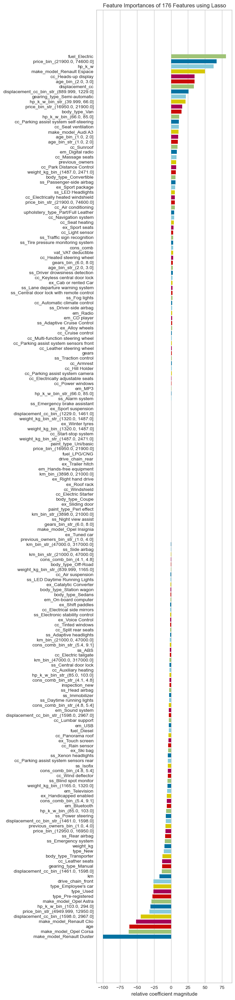

<Axes: title={'center': 'Feature Importances of 176 Features using Lasso'}, xlabel='relative coefficient magnitude'>

In [192]:
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.features import RadViz

viz = FeatureImportances(Lasso(alpha=1.02), labels=X_train.columns)
visualizer = RadViz(size=(720, 3000))
viz.fit(X_train_scaled, y_train)
viz.show()


In [237]:
df_new = auto[["make_model", "hp_kW", "km", "age", "Gearing_Type", "price"]]

# tahminlemeye en fazla etkisi olan 5 feature'ı seçiyoruz.
# Burda make_model feature neden seçildi şeklinde aklınıza bir soru gelebilir. Yukardaki görsel incelendiğinde
# tahminlemeye en fazla etkisi olan featurlar arasında make_model featurenın unique kategorik
# gözlemlerinin (Audi A3, AudiA1, Renault Espace vb) olduğunu gördüğümüzden make_model featuranı da seçtik.

In [238]:
df_new.head()

,make_model,hp_kW,km,age,Gearing_Type,price
0,Audi A1,66.0,56013.0,3.0,Automatic,15770
1,Audi A1,141.0,80000.0,2.0,Automatic,14500
2,Audi A1,85.0,83450.0,3.0,Automatic,14640
3,Audi A1,66.0,73000.0,3.0,Automatic,14500
4,Audi A1,66.0,16200.0,3.0,Automatic,16790


In [239]:
# yukarda yaptığımız işlemleri tekrarlıyoruz

df_new[df_new["make_model"] == "Audi A2"]

,make_model,hp_kW,km,age,Gearing_Type,price
2614,Audi A2,85.0,26166.0,1.0,Manual,28200


In [240]:
df_new.drop(index=[2614], inplace=True)

In [241]:
df_new = df_new[~(df_new.price > 35000)]

In [242]:
df_new = pd.get_dummies(df_new)
df_new.head()

,hp_kW,km,age,price,make_model_Audi A1,make_model_Audi A3,make_model_Opel Astra,make_model_Opel Corsa,make_model_Opel Insignia,make_model_Renault Clio,make_model_Renault Duster,make_model_Renault Espace,Gearing_Type_Automatic,Gearing_Type_Manual,Gearing_Type_Semi-automatic
0,66.0,56013.0,3.0,15770,True,False,False,False,False,False,False,False,True,False,False
1,141.0,80000.0,2.0,14500,True,False,False,False,False,False,False,False,True,False,False
2,85.0,83450.0,3.0,14640,True,False,False,False,False,False,False,False,True,False,False
3,66.0,73000.0,3.0,14500,True,False,False,False,False,False,False,False,True,False,False
4,66.0,16200.0,3.0,16790,True,False,False,False,False,False,False,False,True,False,False


In [207]:
len(df_new)

15419

In [243]:
# yeni 6 featurlı data setimize göre X ve y mizi belirleyip modeli yeniden kuruyoruz.

X = df_new.drop(columns=["price"])
y = df_new.price

In [244]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=42)

In [256]:
scaler = RobustScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [257]:
lasso_model = Lasso(random_state=42)

param_grid = {'alpha': alpha_space}

lasso_final_model = GridSearchCV(estimator=lasso_model,
                                 param_grid=param_grid,
                                 scoring='neg_root_mean_squared_error',
                                 cv=10,
                                 n_jobs=-1)

In [258]:
lasso_final_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=Lasso(random_state=42), n_jobs=-1,
             param_grid={'alpha': array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03...
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727273,
       0.07818182, 0.07909091, 0.08      , 0.08090909, 0.08181818,
       0.08272727, 0.08363636, 0.08454545, 0.08545455, 0.08636364,
       0.08727273, 0.08818182, 0.08909091, 0.09      , 0.09090909,
       0.09181818, 0.09272727, 0.09363636, 0.09454545, 0.09545455,
       0.09636364, 0.09727273, 0.09818182, 0.09909091, 0.1       ])},
             scoring='neg_root_mean_squared_error')

In [262]:
lasso_final_model.best_params_

{'alpha': 0.06454545454545454}

In [263]:
lasso_final_model.best_score_

-2239.5878280316665

In [264]:
y_train_pred = lasso_final_model.predict(X_train_scaled)
y_test_pred = lasso_final_model.predict(X_test_scaled)

convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_test_pred, "lasso_final_model"))


,lasso_final_model_train,lasso_final_model_test
R2,0.87,0.88
mae,1611.73,1553.98
mse,5007033.40,4547562.54
rmse,2237.64,2132.50


In [265]:
y_pred = lasso_final_model.predict(X_test_scaled)
fm_R2 = r2_score(y_test, y_pred)
fm_mae = mean_absolute_error(y_test, y_pred)
fm_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

<h1 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Final Model and Prediction</b>
</h1>

In [267]:
# Son aşamada train ve test seti şeklinde ayırım yapmadığımızı unutmayın

final_scaler = RobustScaler()
final_scaler.fit(X)
X_scaled = final_scaler.transform(X)

In [268]:
lasso_model = Lasso()

param_grid = {'alpha': alpha_space}

final_model = GridSearchCV(estimator=lasso_model,
                           param_grid=param_grid,
                           scoring='neg_root_mean_squared_error',
                           cv=10,
                           n_jobs=-1)

In [269]:
final_model.fit(X_scaled, y)

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03272727, 0.033636...
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727273,
       0.07818182, 0.07909091, 0.08      , 0.08090909, 0.08181818,
       0.08272727, 0.08363636, 0.08454545, 0.08545455, 0.08636364,
       0.08727273, 0.08818182, 0.08909091, 0.09      , 0.09090909,
       0.09181818, 0.09272727, 0.09363636, 0.09454545, 0.09545455,
       0.09636364, 0.09727273, 0.09818182, 0.09909091, 0.1       ])},
             scoring='neg_root_mean_squared_error')

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Prediction with New Observation</b>
</h2>

In [270]:
my_dict = {
    "hp_kW": 66,
    "age": 2,
    "km": 17000,
    "make_model": 'Audi A3',
    "Gearing_Type": "Automatic"
}

In [271]:
my_dict = pd.DataFrame([my_dict])
my_dict

,hp_kW,age,km,make_model,Gearing_Type
0,66,2,17000,Audi A3,Automatic


In [272]:
my_dict = pd.get_dummies(my_dict)
my_dict

,hp_kW,age,km,make_model_Audi A3,Gearing_Type_Automatic
0,66,2,17000,True,True


In [273]:
X.head(1)


,hp_kW,km,age,make_model_Audi A1,make_model_Audi A3,make_model_Opel Astra,make_model_Opel Corsa,make_model_Opel Insignia,make_model_Renault Clio,make_model_Renault Duster,make_model_Renault Espace,Gearing_Type_Automatic,Gearing_Type_Manual,Gearing_Type_Semi-automatic
0,66.0,56013.0,3.0,True,False,False,False,False,False,False,False,True,False,False


In [274]:
my_dict = my_dict.reindex(columns=X.columns, fill_value=0)
my_dict

,hp_kW,km,age,make_model_Audi A1,make_model_Audi A3,make_model_Opel Astra,make_model_Opel Corsa,make_model_Opel Insignia,make_model_Renault Clio,make_model_Renault Duster,make_model_Renault Espace,Gearing_Type_Automatic,Gearing_Type_Manual,Gearing_Type_Semi-automatic
0,66,17000,2,0,True,0,0,0,0,0,0,True,0,0


In [275]:
my_dict = final_scaler.transform(my_dict)
my_dict

array([[-0.55882353, -0.09671791,  0.5       ,  0.        ,  1.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  1.        , -1.        ,  0.        ]])

In [276]:
final_model.predict(my_dict)

array([19558.38100824])

<h2 style="background-color: #20B2AA; font-family: newtimeroman; font-size: 150%; color: white; border-radius: 40px 10px; padding: 15px; text-align: center;">
  <b>Prediction with Random Samples</b>
</h2>

In [277]:
final_scaler = RobustScaler()
final_scaler.fit(X)
X_scaled = final_scaler.transform(X)

In [278]:
lasso_model = Lasso()

param_grid = {'alpha': alpha_space}

final_model = GridSearchCV(estimator=lasso_model,
                           param_grid=param_grid,
                           scoring='neg_root_mean_squared_error',
                           cv=10,
                           n_jobs=-1)

In [279]:
final_model.fit(X_scaled, y)

GridSearchCV(cv=10, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03272727, 0.033636...
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727273,
       0.07818182, 0.07909091, 0.08      , 0.08090909, 0.08181818,
       0.08272727, 0.08363636, 0.08454545, 0.08545455, 0.08636364,
       0.08727273, 0.08818182, 0.08909091, 0.09      , 0.09090909,
       0.09181818, 0.09272727, 0.09363636, 0.09454545, 0.09545455,
       0.09636364, 0.09727273, 0.09818182, 0.09909091, 0.1       ])},
             scoring='neg_root_mean_squared_error')

In [280]:
final_model.best_estimator_

Lasso(alpha=0.1)

In [281]:
random_samples = df_new.sample(n=20)

In [282]:
X_random = random_samples.drop(columns=["price"])

In [283]:
X_random = final_scaler.transform(X_random)

In [284]:
predictions = final_model.predict(X_random)
predictions

array([ 7455.86059824, 25272.41838765, 17802.16868324, 22939.20636202,
       22241.79426294, 28444.81597502,  4187.53461972,  4646.16773791,
       19118.43180132, 11568.25386404, 27404.07501609, 15503.42957005,
       18712.16046082, 18115.49277653, 23994.71133625,  5227.95777077,
       16469.83563763, 17755.57480687, 13598.35631002, 19263.90997225])

In [285]:
true_labels = random_samples["price"].values
true_labels

array([ 8950, 23600, 17990, 22500, 17950, 33500,  7690,  7690, 16900,
       10797, 33750, 16500, 17000, 17780, 25880,  7395, 17950, 15850,
       10990, 17950], dtype=int64)

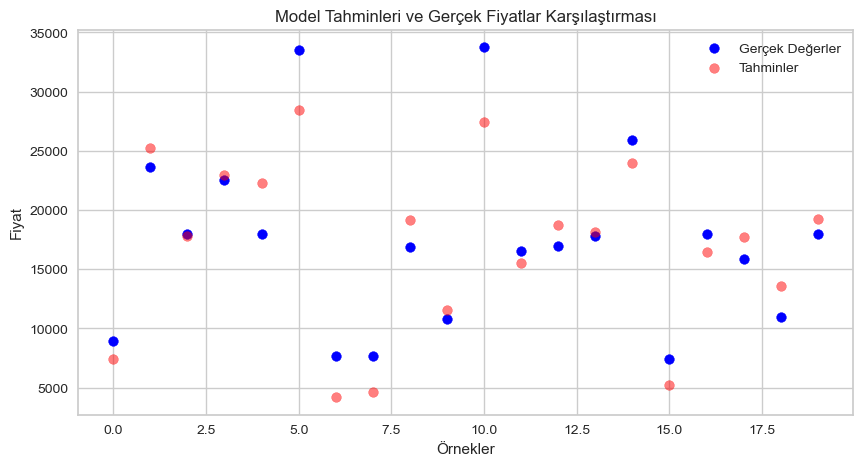

In [286]:
plt.figure(figsize=(10, 5))
plt.scatter(range(len(true_labels)), true_labels, color='blue', label='Gerçek Değerler')
plt.scatter(range(len(predictions)), predictions, color='red', label='Tahminler', alpha=0.5)
plt.title('Model Tahminleri ve Gerçek Fiyatlar Karşılaştırması')
plt.xlabel('Örnekler')
plt.ylabel('Fiyat')
plt.legend()
plt.show()

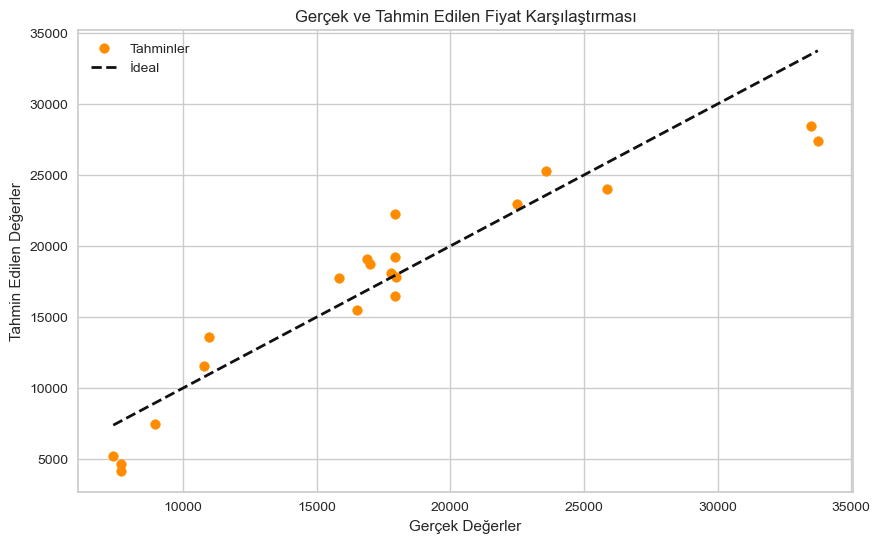

In [287]:
plt.figure(figsize=(10, 6))
plt.scatter(true_labels, predictions, color='darkorange', label='Tahminler')
plt.plot([min(true_labels), max(true_labels)], [min(true_labels), max(true_labels)], 'k--', lw=2, label='İdeal')
plt.xlabel('Gerçek Değerler')
plt.ylabel('Tahmin Edilen Değerler')
plt.title('Gerçek ve Tahmin Edilen Fiyat Karşılaştırması')
plt.legend()
plt.show()